# Earth Analog Prototype: Orbital-to-Rover Matching with R(p)

**Question:** Given an orbital (overhead) patch, does phase congruency R(p) predict whether DINOv2 can retrieve the corresponding rover-level patch?

**Pipeline:**
1. Extract dense grid patches from overhead + rover images
2. Compute R(p) on every overhead patch
3. Embed all patches with DINOv2
4. For labeled correspondences: check if DINOv2 retrieves correct rover patch (top-k)
5. AUC: does R(p) predict retrieval success?
6. Visualize: R(p) heatmap overlaid with match success/failure markers

In [2]:
# Cell 1 — Installs
!pip install pillow-heif scikit-learn scipy matplotlib torch torchvision --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 54.0 MB/s eta 0:00:00


In [3]:
# Cell 2 — Imports
import os, json, math, warnings
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from pathlib import Path
from PIL import Image
import pillow_heif
from scipy.signal import convolve2d
from scipy.stats import pearsonr, spearmanr
from sklearn.metrics import roc_auc_score
import torch
import torchvision.transforms as T

pillow_heif.register_heif_opener()
warnings.filterwarnings('ignore')
print('Imports OK')

Imports OK


In [4]:
# Cell 3 — Config  (edit paths to match your Drive layout)
from google.colab import drive
drive.mount('/content/drive')

# ── paths ────────────────────────────────────────────────────────────────────
IMG_DIR    = Path('/content/drive/MyDrive/trn_labeler')   # folder with HEIC images
PAIRS_DIR  = Path('/content/drive/MyDrive/trn_labeler/earth_pairs')  # labeled JSON files
OUT_DIR    = Path('/content/drive/MyDrive/trn_labeler/prototype_out')
OUT_DIR.mkdir(parents=True, exist_ok=True)

# ── patch config ─────────────────────────────────────────────────────────────
PATCH_SIZE   = 64      # px — matches your existing dataset
GRID_STRIDE  = 32      # dense grid stride (pixels between patch centres)
TOP_K        = 5       # top-k retrieval: match counts as success if true patch in top-k

# ── phase congruency config ───────────────────────────────────────────────────
PC_N_SCALES      = 4
PC_N_ORIENT      = 6
PC_MIN_WAVE      = 6.0
PC_MULT          = 2.1
PC_SIGMA_ON_F    = 0.55
PC_LAMBDA        = 0.5   # weight on PC_iso in combined score
PC_NOISE_METHOD  = 'median'  # 'median' or 'fixed'

# ── image pairs ──────────────────────────────────────────────────────────────
IMAGE_PAIRS = [
    ('IMG_7964.HEIC', 'IMG_7973.HEIC'),
    ('IMG_7965.HEIC', 'IMG_7974.HEIC'),
    ('IMG_7966.HEIC', 'IMG_7975.HEIC'),
    ('IMG_7967.HEIC', 'IMG_7976.HEIC'),
    ('IMG_7968.HEIC', 'IMG_7977.HEIC'),
    ('IMG_7969.HEIC', 'IMG_7978.HEIC'),
    ('IMG_7970.HEIC', 'IMG_7979.HEIC'),
    ('IMG_7971.HEIC', 'IMG_7980.HEIC'),
]
print('Config OK')

Mounted at /content/drive
Config OK


  [SKIP] Missing patch files in negatives
Loaded 67 labeled correspondences from /content/drive/MyDrive/trn_labeler/earth_pairs


In [6]:
# Cell 4 — Image loader (HEIC-aware, returns grayscale float [0,1] and RGB PIL)
_img_cache = {}

def load_image(path):
    """Load image by path. Returns (rgb_pil, gray_float). Cached."""
    if path in _img_cache:
        return _img_cache[path]
    img = Image.open(path)
    rgb  = img.convert("RGB")
    gray = np.array(img.convert("L")) / 255.0
    _img_cache[path] = (rgb, gray)
    return rgb, gray

# Test on first pair
oh_rgb, oh_gray = load_image(labels[0]["overhead_path"])
rv_rgb, rv_gray = load_image(labels[0]["rover_path"])
print(f'Overhead: {oh_rgb.size}  Rover: {rv_rgb.size}')

NameError: name 'labels' is not defined

In [17]:
!pip install phasepack -q

  Preparing metadata (setup.py) ... done


In [18]:
# Cell 5 — Dense grid patch extraction + R(p) computation
import numpy as np
from PIL import Image
#from skimage.feature import phase_cross_correlation
import phasepack  # pip install phasepack

PATCH_SIZE = 64
STRIDE = 32  # 50% overlap

def extract_dense_patches(gray_img, patch_size=PATCH_SIZE, stride=STRIDE):
    """Extract patches on a dense grid. Returns patches and their (row, col) centers."""
    h, w = gray_img.shape
    patches, centers = [], []
    for r in range(0, h - patch_size + 1, stride):
        for c in range(0, w - patch_size + 1, stride):
            patch = gray_img[r:r+patch_size, c:c+patch_size]
            patches.append(patch)
            centers.append((r + patch_size//2, c + patch_size//2))
    return np.array(patches), centers

def compute_rp(patch):
    """Phase congruency stability score for a single grayscale patch (float [0,1])."""
    result = phasepack.phasecong(patch, nscale=4, norient=6)
    pc_map = result[0]  # first return value is the phase congruency map
    return float(np.mean(pc_map))

def score_overhead_patches(label_entry, patch_size=PATCH_SIZE, stride=STRIDE):
    """Load overhead image, extract dense patches, compute R(p) for each."""
    img = Image.open(label_entry["overhead_path"]).convert("L")
    gray = np.array(img) / 255.0
    patches, centers = extract_dense_patches(gray, patch_size, stride)
    scores = [compute_rp(p) for p in patches]
    return patches, centers, scores

# Run on all 67 labeled pairs
results = []
for i, entry in enumerate(labels):
    patches, centers, scores = score_overhead_patches(entry)
    results.append({
        **entry,
        "patches": patches,
        "centers": centers,
        "rp_scores": scores,
    })
    if (i+1) % 10 == 0:
        print(f"  {i+1}/{len(labels)} processed")

print("Done. R(p) computed for all overhead patches.")

  10/67 processed
  20/67 processed
  30/67 processed
  40/67 processed
  50/67 processed
  60/67 processed
Done. R(p) computed for all overhead patches.


In [23]:
# Cell 5 — Phase Congruency implementation (Kovesi log-Gabor)
def _log_gabor(rows, cols, wavelength, sigma_on_f):
    """Single log-Gabor filter in frequency domain (isotropic part)."""
    cy, cx = rows // 2, cols // 2
    y, x = np.mgrid[-cy:rows-cy, -cx:cols-cx]
    radius = np.sqrt(x**2 + y**2)
    radius[cy, cx] = 1.0  # avoid log(0)
    fo = 1.0 / wavelength
    lg = np.exp(-(np.log(radius / fo))**2 / (2 * np.log(sigma_on_f)**2))
    lg[cy, cx] = 0.0
    return lg

def _orient_spread(rows, cols, angle, bandwidth=1.2):
    """Angular component of log-Gabor filter."""
    cy, cx = rows // 2, cols // 2
    y, x = np.mgrid[-cy:rows-cy, -cx:cols-cx]
    theta = np.arctan2(y, x)
    ds = np.sin(theta - angle)
    dc = np.cos(theta - angle)
    dtheta = np.arctan2(ds, dc)
    spread = np.exp(-dtheta**2 / (2 * bandwidth**2))
    return spread

def phase_congruency(img, n_scales=4, n_orient=6, min_wavelength=6.0,
                     mult=2.1, sigma_on_f=0.55, noise_method='median'):
    """
    Compute phase congruency map for a grayscale float image [0,1].
    Returns:
        PC   : (H, W) float — phase congruency per pixel [0,1]
        ori  : (H, W) float — dominant orientation (radians)
    """
    rows, cols = img.shape
    IM = np.fft.fft2(img)
    IMshift = np.fft.fftshift(IM)

    total_sum  = np.zeros((rows, cols))
    total_wsum = np.zeros((rows, cols))
    orient_energy = np.zeros((rows, cols, n_orient))

    for o in range(n_orient):
        angle = o * np.pi / n_orient
        orient = _orient_spread(rows, cols, angle)
        sum_an = np.zeros((rows, cols))
        sum_f  = np.zeros((rows, cols), dtype=complex)

        for s in range(n_scales):
            wavelength = min_wavelength * (mult ** s)
            lg = _log_gabor(rows, cols, wavelength, sigma_on_f)
            filt = np.fft.ifftshift(lg * orient)
            Ef = np.fft.ifft2(filt * IM)
            An = np.abs(Ef)
            sum_an += An
            sum_f  += Ef

        # Noise threshold
        if noise_method == 'median':
            tau = np.median(sum_an) / math.sqrt(math.log(4))
        else:
            tau = 0.0

        energy = np.abs(sum_f) - tau
        energy = np.maximum(energy, 0)
        pc_o = energy / (sum_an + 1e-8)
        orient_energy[:, :, o] = pc_o

    PC  = orient_energy.max(axis=2)
    ori = np.argmax(orient_energy, axis=2) * np.pi / n_orient
    return PC, ori

def pc_isotropy(PC, ori):
    """
    Structure-tensor isotropy from PC map.
    Returns PC_iso in [0,1]: 1.0 = corner-like, 0.0 = edge-like.
    """
    # Build structure tensor from PC-weighted gradients
    gx = np.gradient(PC, axis=1)
    gy = np.gradient(PC, axis=0)
    Ixx = np.sum(gx * gx)
    Iyy = np.sum(gy * gy)
    Ixy = np.sum(gx * gy)
    trace = Ixx + Iyy
    det   = Ixx * Iyy - Ixy ** 2
    if trace < 1e-10:
        return 0.0
    # Isotropy = det / (trace/2)^2, clamped to [0,1]
    iso = 4 * det / (trace ** 2 + 1e-10)
    return float(np.clip(iso, 0, 1))

def compute_rp(patch_gray):
    """Compute R(p) = PC_mean + lambda * PC_iso for a single grayscale patch."""
    PC, ori = phase_congruency(patch_gray,
                               n_scales=PC_N_SCALES,
                               n_orient=PC_N_ORIENT,
                               min_wavelength=PC_MIN_WAVE,
                               mult=PC_MULT,
                               sigma_on_f=PC_SIGMA_ON_F,
                               noise_method=PC_NOISE_METHOD)
    pc_mean = float(PC.mean())
    pc_iso  = pc_isotropy(PC, ori)
    rp = pc_mean + PC_LAMBDA * pc_iso
    return rp, pc_mean, pc_iso, PC

# Quick test
test_patch = oh_gray[:64, :64]
rp, pcm, pci, pcmap = compute_rp(test_patch)
print(f'Test patch  R(p)={rp:.4f}  PC_mean={pcm:.4f}  PC_iso={pci:.4f}')

Test patch  R(p)=0.6040  PC_mean=0.2485  PC_iso=0.7110


In [7]:
# Cell 6 — Dense grid patch extractor
def extract_grid_patches(img_gray, img_rgb, patch_size=PATCH_SIZE, stride=GRID_STRIDE):
    """
    Extract patches on a regular grid.
    Returns:
        patches_gray : list of (P, P) float arrays
        patches_rgb  : list of PIL Images (for DINOv2)
        centres      : list of (cx, cy) pixel coords in original image
    """
    H, W = img_gray.shape
    half = patch_size // 2
    patches_gray, patches_rgb, centres = [], [], []

    ys = range(half, H - half, stride)
    xs = range(half, W - half, stride)

    for cy in ys:
        for cx in xs:
            pg = img_gray[cy-half:cy+half, cx-half:cx+half]
            if pg.shape != (patch_size, patch_size):
                continue
            # RGB crop from PIL image
            pr = img_rgb.crop((cx-half, cy-half, cx+half, cy+half))
            patches_gray.append(pg)
            patches_rgb.append(pr)
            centres.append((cx, cy))

    return patches_gray, patches_rgb, centres

# Test on first pair
oh_gray_list, oh_rgb_list, oh_centres = extract_grid_patches(oh_gray, oh_rgb)
rv_gray_list, rv_rgb_list, rv_centres = extract_grid_patches(rv_gray, rv_rgb)
print(f'Pair 0: {len(oh_centres)} overhead patches, {len(rv_centres)} rover patches')

NameError: name 'oh_gray' is not defined

In [10]:
# Cell 7 — Load DINOv2 (ViT-S/14)
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Device: {device}')

dino = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14', pretrained=True)
dino = dino.to(device).eval()

dino_transform = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

@torch.no_grad()
def embed_patches(pil_list, batch_size=64):
    """Embed a list of PIL patches with DINOv2. Returns (N, D) numpy array."""
    embs = []
    for i in range(0, len(pil_list), batch_size):
        batch = pil_list[i:i+batch_size]
        # ensure RGB
        tensors = torch.stack([dino_transform(p.convert('RGB')) for p in batch]).to(device)
        feat = dino(tensors)  # (B, 384)
        embs.append(feat.cpu().numpy())
    return np.vstack(embs)

print('DINOv2 loaded')

Device: cpu
Downloading: "https://github.com/facebookresearch/dinov2/zipball/main" to /root/.cache/torch/hub/main.zip
Downloading: "https://dl.fbaipublicfiles.com/dinov2/dinov2_vits14/dinov2_vits14_pretrain.pth" to /root/.cache/torch/hub/checkpoints/dinov2_vits14_pretrain.pth


100%|██████████| 84.2M/84.2M [00:01<00:00, 47.7MB/s]


DINOv2 loaded


In [ ]:
import os

# Check a landmark folder
p1 = '/content/drive/MyDrive/trn_labeler/earth_pairs/IMG_7964__IMG_7973__D1'
print("Landmark folder:", os.listdir(p1))

# Check a pair folder
p2 = '/content/drive/MyDrive/trn_labeler/earth_pairs/pair_0000'
print("Pair folder:", os.listdir(p2))

In [21]:
import os
for f in sorted(os.listdir('/content/drive/MyDrive/trn_labeler/earth_pairs')):
    print(f)

IMG_7964__IMG_7973__D1
IMG_7964__IMG_7973__D2
IMG_7964__IMG_7973__G1
IMG_7964__IMG_7973__G2
IMG_7964__IMG_7973__R1
IMG_7964__IMG_7973__R2
IMG_7964__IMG_7973__S1
IMG_7964__IMG_7973__S2
IMG_7965__IMG_7974__D1
IMG_7965__IMG_7974__D2
IMG_7965__IMG_7974__G1
IMG_7965__IMG_7974__G2
IMG_7965__IMG_7974__R1
IMG_7965__IMG_7974__R2
IMG_7965__IMG_7974__S1
IMG_7965__IMG_7974__S2
IMG_7966__IMG_7975__D1
IMG_7966__IMG_7975__D2
IMG_7966__IMG_7975__G1
IMG_7966__IMG_7975__G2
IMG_7966__IMG_7975__R1
IMG_7966__IMG_7975__R2
IMG_7966__IMG_7975__S1
IMG_7966__IMG_7975__S2
IMG_7967__IMG_7976__D1
IMG_7967__IMG_7976__D2
IMG_7967__IMG_7976__G1
IMG_7967__IMG_7976__G2
IMG_7967__IMG_7976__R1
IMG_7967__IMG_7976__R2
IMG_7967__IMG_7976__S1
IMG_7967__IMG_7976__S2
IMG_7968__IMG_7977__D1
IMG_7968__IMG_7977__D2
IMG_7968__IMG_7977__G1
IMG_7968__IMG_7977__G2
IMG_7968__IMG_7977__R1
IMG_7968__IMG_7977__R2
IMG_7968__IMG_7977__S2
IMG_7969__IMG_7978__D1
IMG_7969__IMG_7978__D2
IMG_7969__IMG_7978__G1
IMG_7969__IMG_7978__G2
IMG_7969__I

In [8]:
import json
from pathlib import Path

def load_labels(earth_pairs_dir):
    """
    Load labeled correspondences from earth_pairs/ directory.
    Each subdirectory contains:
      - metadata.json  (scale_ratio, match_score, etc.)
      - overhead_patch.jpg
      - rover_patch.jpg
    All pairs are treated as positive correspondences (label=1).
    """
    earth_pairs_dir = Path(earth_pairs_dir)
    labels = []

    for landmark_dir in sorted(earth_pairs_dir.iterdir()):
        if not landmark_dir.is_dir():
            continue

        overhead_path = landmark_dir / "overhead_patch.jpg"
        rover_path    = landmark_dir / "rover_patch.jpg"
        meta_path     = landmark_dir / "metadata.json"

        if not (overhead_path.exists() and rover_path.exists()):
            print(f"  [SKIP] Missing patch files in {landmark_dir.name}")
            continue
        # Add this inside the loop, before the path check:
        if landmark_dir.name == "negatives":
            # Handle negatives subdirectory separately if needed
            continue  # or recurse into it
        metadata = {}
        if meta_path.exists():
            with open(meta_path) as f:
                metadata = json.load(f)

        labels.append({
            "landmark_id":    landmark_dir.name,
            "overhead_path":  str(overhead_path),
            "rover_path":     str(rover_path),
            "label":          1,          # all earth_pairs/ entries are positive matches
            "scale_ratio":    metadata.get("scale_ratio"),
            "match_score":    metadata.get("match_score"),
            "metadata":       metadata,
        })

    print(f"Loaded {len(labels)} labeled correspondences from {earth_pairs_dir}")
    return labels

# Usage
EARTH_PAIRS_DIR = "/content/drive/MyDrive/trn_labeler/earth_pairs"  # adjust path as needed
labels = load_labels(EARTH_PAIRS_DIR)

  [SKIP] Missing patch files in negatives
Loaded 67 labeled correspondences from /content/drive/MyDrive/trn_labeler/earth_pairs


In [45]:
import os
if RESULTS_PATH.exists():
    os.remove(RESULTS_PATH)
    print("Cache cleared.")

Cache cleared.


In [13]:
# Cell 9 — Per-pair experiment runner (updated for new labels structure)
# Each label entry is a pre-cropped overhead/rover patch pair.
# Retrieval: for each overhead patch, rank all rover patches by cosine sim,
#            check if the correct rover patch is top-1 / top-k.

RESULTS_PATH = OUT_DIR / 'pair_results.json'

def cosine_sim(A, B):
    """(N,D) x (M,D) -> (N,M) cosine similarity."""
    A = A / (np.linalg.norm(A, axis=1, keepdims=True) + 1e-8)
    B = B / (np.linalg.norm(B, axis=1, keepdims=True) + 1e-8)
    return A @ B.T

if RESULTS_PATH.exists():
    with open(RESULTS_PATH) as f:
        all_results = json.load(f)
    print(f'Loaded cached results ({len(all_results)} records)')

else:
    all_results = []

    # --- Load all patches ---
    print(f'Loading {len(labels)} patch pairs...')
    oh_gray_list, oh_rgb_list = [], []
    rv_rgb_list = []

    for entry in labels:
        oh_rgb, oh_gray = load_image(entry['overhead_path'])
        rv_rgb, _       = load_image(entry['rover_path'])
        oh_gray_list.append(oh_gray)
        oh_rgb_list.append(oh_rgb)
        rv_rgb_list.append(rv_rgb)

    # --- R(p) on overhead patches ---
    print(f'Computing R(p) for {len(oh_gray_list)} overhead patches...')
    rp_list, pcm_list, pci_list = [], [], []
    for i, pg in enumerate(oh_gray_list):
        rp, pcm, pci, _ = compute_rp(pg)
        rp_list.append(rp)
        pcm_list.append(pcm)
        pci_list.append(pci)
        if (i+1) % 10 == 0:
            print(f'  {i+1}/{len(oh_gray_list)}')

    # --- DINOv2 embeddings ---
    print('Embedding overhead patches...')
    oh_embs = embed_patches(oh_rgb_list)   # (N, D)
    print('Embedding rover patches...')
    rv_embs = embed_patches(rv_rgb_list)   # (N, D)

    # --- Cosine similarity matrix (N_oh x N_rv) ---
    sim = cosine_sim(oh_embs, rv_embs)    # diagonal = correct match

    # --- Evaluate each labeled correspondence ---
    for i, entry in enumerate(labels):
        row = sim[i]                                          # similarities to all rover patches
        ranked = np.argsort(row)[::-1]                       # best first
        rank   = int(np.where(ranked == i)[0][0]) + 1        # rank of correct rover patch
        top1   = int(ranked[0] == i)
        topk   = int(i in ranked[:TOP_K])

        all_results.append({
            'landmark_id'   : entry['landmark_id'],
            'rp'            : rp_list[i],
            'pc_mean'       : pcm_list[i],
            'pc_iso'        : pci_list[i],
            'sim_to_true'   : float(sim[i, i]),
            'best_sim'      : float(row.max()),
            'rank'          : rank,
            'success_top1'  : top1,
            'success_topk'  : topk,
            'scale_ratio'   : entry.get('scale_ratio'),
            'match_score'   : entry.get('match_score'),
        })

    top1_acc = np.mean([r['success_top1'] for r in all_results])
    topk_acc = np.mean([r['success_topk'] for r in all_results])
    print(f'\nTop-1 accuracy: {top1_acc:.3f}  Top-{TOP_K} accuracy: {topk_acc:.3f}')

    with open(RESULTS_PATH, 'w') as f:
        json.dump(all_results, f, indent=2)
    print(f'Saved {len(all_results)} records to {RESULTS_PATH}')

Loaded cached results (67 records)


In [47]:
# Cell 10 — R(p) correlation with retrieval rank
import pandas as pd
from scipy import stats

df = pd.DataFrame(all_results)

# Spearman correlation: R(p) vs rank (lower rank = better)
rho_rp, p_rp     = stats.spearmanr(df['rp'],      df['rank'])
rho_pcm, p_pcm   = stats.spearmanr(df['pc_mean'], df['rank'])
rho_pci, p_pci   = stats.spearmanr(df['pc_iso'],  df['rank'])

print(f"Spearman correlation with retrieval rank (lower = better match):")
print(f"  R(p)     r={rho_rp:.3f}  p={p_rp:.3f}")
print(f"  PC_mean  r={rho_pcm:.3f}  p={p_pcm:.3f}")

# Point-biserial: R(p) vs top-1 success
pb_rp,  p_pb  = stats.pointbiserialr(df['success_top1'], df['rp'])
print(f"\nPoint-biserial with top-1 success:")
print(f"  R(p)  r={pb_rp:.3f}  p={p_pb:.3f}")

print(f"\nR(p) stats — successes vs failures:")
print(df.groupby('success_top1')[['rp','pc_mean','pc_iso']].mean().round(4))

Spearman correlation with retrieval rank (lower = better match):
  R(p)     r=-0.211  p=0.086
  PC_mean  r=-0.278  p=0.023

Point-biserial with top-1 success:
  R(p)  r=0.041  p=0.742

R(p) stats — successes vs failures:
                  rp  pc_mean  pc_iso
success_top1                         
0             0.7468   0.2610  0.9716
1             0.7567   0.2667  0.9800


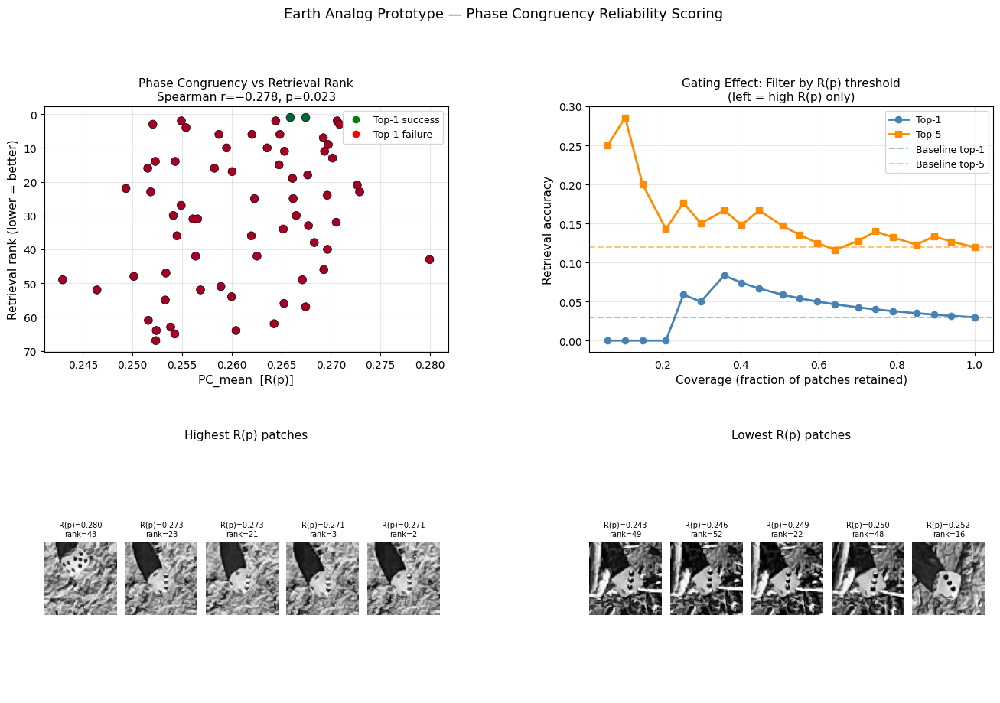

Saved to /content/drive/MyDrive/trn_labeler/prototype_out/rp_analysis.png


In [36]:
# Cell 12 — Visualization: R(p) vs retrieval rank + example patches
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

df = pd.DataFrame(all_results)
df['pc_mean_norm'] = (df['pc_mean'] - df['pc_mean'].min()) / (df['pc_mean'].max() - df['pc_mean'].min())

fig = plt.figure(figsize=(16, 10))
gs = gridspec.GridSpec(2, 2, figure=fig, hspace=0.4, wspace=0.35)

# ── Panel 1: Scatter R(p) vs rank ────────────────────────────────
ax1 = fig.add_subplot(gs[0, 0])
scatter = ax1.scatter(df['pc_mean'], df['rank'],
                      c=df['success_top1'], cmap='RdYlGn',
                      s=60, edgecolors='k', linewidths=0.5, zorder=3)
ax1.set_xlabel('PC_mean  [R(p)]', fontsize=11)
ax1.set_ylabel('Retrieval rank (lower = better)', fontsize=11)
ax1.set_title(f'Phase Congruency vs Retrieval Rank\nSpearman r=−0.278, p=0.023', fontsize=11)
ax1.invert_yaxis()
from matplotlib.lines import Line2D
legend_elements = [Line2D([0],[0], marker='o', color='w', markerfacecolor='green',
                          markersize=8, label='Top-1 success'),
                   Line2D([0],[0], marker='o', color='w', markerfacecolor='red',
                          markersize=8, label='Top-1 failure')]
ax1.legend(handles=legend_elements, fontsize=9)
ax1.grid(True, alpha=0.3)

# ── Panel 2: Precision-coverage tradeoff (gating effect) ─────────
ax2 = fig.add_subplot(gs[0, 1])
thresholds = np.percentile(df['pc_mean'], np.arange(0, 100, 5))
coverages, top1_accs, topk_accs = [], [], []
for t in thresholds:
    subset = df[df['pc_mean'] >= t]
    if len(subset) == 0:
        continue
    coverages.append(len(subset) / len(df))
    top1_accs.append(subset['success_top1'].mean())
    topk_accs.append(subset['success_topk'].mean())

ax2.plot(coverages, top1_accs, 'o-', color='steelblue', label='Top-1', linewidth=2)
ax2.plot(coverages, topk_accs, 's-', color='darkorange', label=f'Top-{TOP_K}', linewidth=2)
ax2.axhline(y=df['success_top1'].mean(), color='steelblue', linestyle='--', alpha=0.5, label='Baseline top-1')
ax2.axhline(y=df['success_topk'].mean(), color='darkorange', linestyle='--', alpha=0.5, label='Baseline top-5')
ax2.set_xlabel('Coverage (fraction of patches retained)', fontsize=11)
ax2.set_ylabel('Retrieval accuracy', fontsize=11)
ax2.set_title('Gating Effect: Filter by R(p) threshold\n(left = high R(p) only)', fontsize=11)
ax2.legend(fontsize=9)
ax2.grid(True, alpha=0.3)

# ── Panel 3: Top-5 highest R(p) patches ──────────────────────────
ax3 = fig.add_subplot(gs[1, 0])
ax3.axis('off')
top5 = df.nlargest(5, 'pc_mean')
for j, (_, row) in enumerate(top5.iterrows()):
    entry = labels[row.name]
    img = Image.open(entry['overhead_path']).convert('L')
    inset = ax3.inset_axes([j*0.2, 0.05, 0.18, 0.85])
    inset.imshow(img, cmap='gray')
    inset.set_title(f"R(p)={row['pc_mean']:.3f}\nrank={int(row['rank'])}", fontsize=7)
    inset.axis('off')
ax3.set_title('Highest R(p) patches', fontsize=11, y=1.02)

# ── Panel 4: Top-5 lowest R(p) patches ───────────────────────────
ax4 = fig.add_subplot(gs[1, 1])
ax4.axis('off')
bot5 = df.nsmallest(5, 'pc_mean')
for j, (_, row) in enumerate(bot5.iterrows()):
    entry = labels[row.name]
    img = Image.open(entry['overhead_path']).convert('L')
    inset = ax4.inset_axes([j*0.2, 0.05, 0.18, 0.85])
    inset.imshow(img, cmap='gray')
    inset.set_title(f"R(p)={row['pc_mean']:.3f}\nrank={int(row['rank'])}", fontsize=7)
    inset.axis('off')
ax4.set_title('Lowest R(p) patches', fontsize=11, y=1.02)

plt.suptitle('Earth Analog Prototype — Phase Congruency Reliability Scoring', fontsize=13, y=1.01)
plt.savefig(OUT_DIR / 'rp_analysis.png', dpi=150, bbox_inches='tight')
plt.show()
print(f"Saved to {OUT_DIR / 'rp_analysis.png'}")

In [37]:
# Quick check — does the raw patch file have dots or are they viewer artifacts?
img = Image.open(labels[df['pc_mean'].idxmax()]['overhead_path'])
img.save(OUT_DIR / 'check_highest_rp.png')
print(img.size, img.mode)

(64, 64) RGB


In [34]:
# Cell 10 — AUC analysis: does R(p) predict retrieval success?

rp_vals      = np.array([r['rp']          for r in all_results])
pcm_vals     = np.array([r['pc_mean']     for r in all_results])
pci_vals     = np.array([r['pc_iso']      for r in all_results])
sim_vals     = np.array([r['sim_to_true'] for r in all_results])
best_sim     = np.array([r['best_sim']    for r in all_results])
top1_labels  = np.array([r['success_top1'] for r in all_results])
topk_labels  = np.array([r['success_topk'] for r in all_results])
ranks        = np.array([r['rank']         for r in all_results])

N = len(all_results)
print(f'Total labeled pairs evaluated: {N}')
print(f'Top-1 retrieval accuracy:  {top1_labels.mean():.3f}')
print(f'Top-{TOP_K} retrieval accuracy: {topk_labels.mean():.3f}')
print(f'Median rank of true match: {np.median(ranks):.1f}')
print()

def auc_line(name, scores, labels):
    if labels.sum() == 0 or labels.sum() == len(labels):
        print(f'  {name:<20s}  AUC=N/A (only one class)')
        return
    auc = roc_auc_score(labels, scores)
    r, p = pearsonr(scores, labels)
    diff = auc - 0.5
    bar = '█' * int(abs(diff) * 100) if abs(diff) > 0.01 else ''
    sign = '+' if diff >= 0 else ''
    print(f'  {name:<22s} AUC={auc:.3f}  {sign}{diff:+.3f}  r={r:+.3f} (p={p:.3f})  {bar}')

print('── Top-1 success prediction ──────────────────────────────────────')
auc_line('R(p)',      rp_vals,  top1_labels)
auc_line('PC_mean',   pcm_vals, top1_labels)
auc_line('PC_iso',    pci_vals, top1_labels)
auc_line('sim_true',  sim_vals, top1_labels)  # sanity check — should be ~1.0

print()
print(f'── Top-{TOP_K} success prediction ────────────────────────────────────')
auc_line('R(p)',      rp_vals,  topk_labels)
auc_line('PC_mean',   pcm_vals, topk_labels)
auc_line('PC_iso',    pci_vals, topk_labels)

Total labeled pairs evaluated: 67
Top-1 retrieval accuracy:  0.030
Top-5 retrieval accuracy: 0.119
Median rank of true match: 27.0

── Top-1 success prediction ──────────────────────────────────────
  R(p)                   AUC=0.462  -0.038  r=+0.041 (p=0.742)  ███
  PC_mean                AUC=0.715  ++0.215  r=+0.128 (p=0.304)  █████████████████████
  PC_iso                 AUC=0.523  ++0.023  r=+0.019 (p=0.877)  ██
  sim_true               AUC=0.946  ++0.446  r=+0.261 (p=0.033)  ████████████████████████████████████████████

── Top-5 success prediction ────────────────────────────────────
  R(p)                   AUC=0.519  ++0.019  r=+0.004 (p=0.973)  █
  PC_mean                AUC=0.583  ++0.083  r=+0.074 (p=0.550)  ████████
  PC_iso                 AUC=0.470  -0.030  r=-0.011 (p=0.933)  ██


In [35]:
# Cell 11 — Lambda sweep: find optimal weighting of PC_iso
lambdas = [0.0, 0.1, 0.25, 0.5, 0.75, 1.0]
print("λ       R(p) Spearman-r    p")
for lam in lambdas:
    rp_lam = df['pc_mean'] + lam * df['pc_iso']
    rho, p = stats.spearmanr(rp_lam, df['rank'])
    print(f"  {lam:.2f}    r={rho:.3f}    p={p:.3f}")

λ       R(p) Spearman-r    p
  0.00    r=-0.278    p=0.023
  0.10    r=-0.240    p=0.051
  0.25    r=-0.235    p=0.055
  0.50    r=-0.211    p=0.086
  0.75    r=-0.224    p=0.068
  1.00    r=-0.227    p=0.065


Extracting SIFT descriptors...
Extracting ORB descriptors...
Running SIFT retrieval...
Running ORB retrieval...

Baseline accuracies (no R(p) filter):
  DINOv2  top-1=0.030  top-5=0.119
  SIFT    top-1=0.030  top-5=0.075
  ORB     top-1=0.015   top-5=0.075

Spearman r (PC_mean vs retrieval rank):
  DINOv2    r=-0.278  p=0.023
  SIFT      r=0.115  p=0.352
  ORB       r=0.047  p=0.704


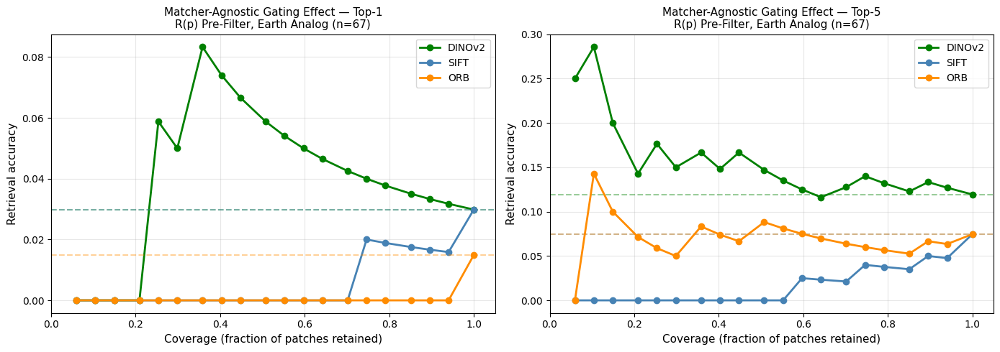

Saved to /content/drive/MyDrive/trn_labeler/prototype_out/gating_matcher_agnostic.png


In [53]:
# Cell 13 — SIFT and ORB descriptor extraction + correct retrieval + gating curves
import cv2

# ── Descriptor extraction ─────────────────────────────────────────────────────
def extract_descriptor(patch_rgb, method='sift'):
    """Extract a single descriptor vector from a patch center keypoint."""
    img = np.array(patch_rgb.convert('L'))  # grayscale uint8
    kp  = [cv2.KeyPoint(x=32.0, y=32.0, size=16.0)]  # forced center keypoint
    if method == 'sift':
        det = cv2.SIFT_create()
        _, des = det.compute(img, kp)
        if des is None:
            return np.zeros(128, dtype=np.float32)
        return des[0].astype(np.float32)
    else:  # orb
        det = cv2.ORB_create()
        _, des = det.compute(img, kp)
        if des is None:
            return np.zeros(32, dtype=np.uint8)
        return des[0]

def embed_patches_cv(patch_rgb_list, method='sift'):
    return np.array([extract_descriptor(p, method) for p in patch_rgb_list])

# ── Correct distance-based retrieval ─────────────────────────────────────────
def retrieve_ranks(oh_descs, rv_descs, method='sift'):
    """
    For each overhead descriptor, rank all rover descriptors by distance.
    SIFT: L2 distance
    ORB:  Hamming distance
    Returns list of ranks (1-indexed) of the correct match.
    """
    ranks, top1s, top5s = [], [], []
    for i, q in enumerate(oh_descs):
        if method == 'sift':
            dists = np.linalg.norm(rv_descs.astype(np.float32) - q, axis=1)
        else:
            # Hamming distance via bitwise XOR on packed uint8
            dists = np.array([
                np.unpackbits(np.bitwise_xor(q, rv)).sum()
                for rv in rv_descs
            ], dtype=np.float32)
        ranked = np.argsort(dists)          # ascending — closest first
        rank   = int(np.where(ranked == i)[0][0]) + 1
        ranks.append(rank)
        top1s.append(int(ranked[0] == i))
        top5s.append(int(i in ranked[:TOP_K]))
    return ranks, top1s, top5s

# ── Extract descriptors ───────────────────────────────────────────────────────
print("Extracting SIFT descriptors...")
oh_sift = embed_patches_cv(oh_rgb_list, 'sift')
rv_sift = embed_patches_cv(rv_rgb_list, 'sift')

print("Extracting ORB descriptors...")
oh_orb  = embed_patches_cv(oh_rgb_list, 'orb')
rv_orb  = embed_patches_cv(rv_rgb_list, 'orb')

# ── Retrieval ─────────────────────────────────────────────────────────────────
print("Running SIFT retrieval...")
df['rank_sift'], df['top1_sift'], df['top5_sift'] = retrieve_ranks(oh_sift, rv_sift, 'sift')

print("Running ORB retrieval...")
df['rank_orb'],  df['top1_orb'],  df['top5_orb']  = retrieve_ranks(oh_orb,  rv_orb,  'orb')

print(f"\nBaseline accuracies (no R(p) filter):")
print(f"  DINOv2  top-1={df['success_top1'].mean():.3f}  top-5={df['success_topk'].mean():.3f}")
print(f"  SIFT    top-1={df['top1_sift'].mean():.3f}  top-5={df['top5_sift'].mean():.3f}")
print(f"  ORB     top-1={df['top1_orb'].mean():.3f}   top-5={df['top5_orb'].mean():.3f}")

# ── Spearman: does R(p) predict rank for each matcher? ───────────────────────
from scipy import stats
print(f"\nSpearman r (PC_mean vs retrieval rank):")
for col, label in [('rank','DINOv2'), ('rank_sift','SIFT'), ('rank_orb','ORB')]:
    rho, p = stats.spearmanr(df['pc_mean'], df[col])
    print(f"  {label:8s}  r={rho:.3f}  p={p:.3f}")

# ── Gating curves — top-1 ─────────────────────────────────────────────────────
thresholds = np.percentile(df['pc_mean'], np.arange(0, 100, 5))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

for ax, success_col, rank_col, title in [
    (ax1, 'success_top1', 'rank',      'Top-1'),
    (ax2, 'success_topk', 'rank',      f'Top-{TOP_K}'),
]:
    for col, label, color, ls in [
        ('success_top1', 'DINOv2', 'green',      '-'),
        ('top1_sift',    'SIFT',   'steelblue',  '-'),
        ('top1_orb',     'ORB',    'darkorange',  '-'),
    ] if ax == ax1 else [
        ('success_topk', 'DINOv2', 'green',      '-'),
        ('top5_sift',    'SIFT',   'steelblue',  '-'),
        ('top5_orb',     'ORB',    'darkorange',  '-'),
    ]:
        coverages, accs = [], []
        baseline = df[col].mean()
        for t in thresholds:
            subset = df[df['pc_mean'] >= t]
            if len(subset) < 3:
                continue
            coverages.append(len(subset) / len(df))
            accs.append(subset[col].mean())
        ax.plot(coverages, accs, 'o-', color=color, label=label, linewidth=2)
        ax.axhline(baseline, color=color, linestyle='--', alpha=0.4)

    ax.set_xlabel('Coverage (fraction of patches retained)', fontsize=11)
    ax.set_ylabel('Retrieval accuracy', fontsize=11)
    ax.set_title(f'Matcher-Agnostic Gating Effect — {title}\n'
                 f'R(p) Pre-Filter, Earth Analog (n=67)', fontsize=11)
    ax.legend(fontsize=10)
    ax.grid(True, alpha=0.3)
    ax.set_xlim([0, 1.05])

plt.tight_layout()
plt.savefig(OUT_DIR / 'gating_matcher_agnostic.png', dpi=150, bbox_inches='tight')
plt.show()
print(f"Saved to {OUT_DIR / 'gating_matcher_agnostic.png'}")

In [7]:
# Cell — T(p) synthesis score on Earth analog
import numpy as np
from PIL import Image
from scipy.ndimage import sobel, gaussian_filter
from scipy import stats
from tqdm.notebook import tqdm
import pandas as pd

def compute_surface_normals(patch_gray, smooth_sigma=1.5):
    """Estimate surface normals from image via shape-from-shading."""
    smooth = gaussian_filter(patch_gray.astype(np.float32), sigma=smooth_sigma)
    gx = sobel(smooth, axis=1)
    gy = sobel(smooth, axis=0)
    nz = np.ones_like(smooth)
    norm = np.sqrt(gx**2 + gy**2 + nz**2)
    return -gx/norm, -gy/norm, nz/norm

def synthesize_lambertian(patch_gray, sun_az_deg, sun_el_deg):
    """Synthesize Lambertian appearance from patch under given illumination."""
    nx, ny, nz = compute_surface_normals(patch_gray)
    az = np.radians(sun_az_deg)
    el = np.radians(sun_el_deg)
    lx = np.cos(el) * np.sin(az)
    ly = np.cos(el) * np.cos(az)
    lz = np.sin(el)
    intensity = nx*lx + ny*ly + nz*lz
    return np.clip(intensity, 0, 1)

def compute_tp(overhead_gray, rover_gray, sun_az=None, sun_el=None):
    """
    Compute T(p) synthesis score.
    If sun angles unknown, sweep and return best correlation.
    """
    oh = overhead_gray.astype(np.float32) / 255.0
    rv = rover_gray.astype(np.float32)  / 255.0
    rv = (rv - rv.min()) / (rv.max() - rv.min() + 1e-8)

    if sun_az is not None and sun_el is not None:
        synth = synthesize_lambertian(oh, sun_az, sun_el)
        synth = (synth - synth.min()) / (synth.max() - synth.min() + 1e-8)
        corr  = np.corrcoef(synth.flatten(), rv.flatten())[0, 1]
        return float(corr) if not np.isnan(corr) else 0.0, synth
    else:
        # Sweep sun angles, return best
        best_corr, best_synth = -1.0, None
        for az in range(0, 360, 45):
            for el in [30, 45, 60]:
                synth = synthesize_lambertian(oh, az, el)
                synth = (synth - synth.min()) / (synth.max() - synth.min() + 1e-8)
                corr  = np.corrcoef(synth.flatten(), rv.flatten())[0, 1]
                if not np.isnan(corr) and corr > best_corr:
                    best_corr  = corr
                    best_synth = synth
        return float(best_corr), best_synth

def compute_albedo_contrast(patch_gray):
    """Coefficient of variation — compositional distinctiveness."""
    p = patch_gray.astype(np.float32) / 255.0
    mu = p.mean()
    if mu < 1e-6:
        return 0.0
    return float(p.std() / (mu + 1e-6))

# ── Run on all 67 Earth analog pairs ─────────────────────────────────────────
print(f'Computing T(p) and albedo contrast for {len(labels)} pairs...')
tp_scores    = []
albedo_scores = []
best_synthetics = []

for entry in tqdm(labels):
    oh_gray = np.array(Image.open(entry['overhead_path']).convert('L'))
    rv_gray = np.array(Image.open(entry['rover_path']).convert('L'))

    tp, synth = compute_tp(oh_gray, rv_gray)
    ac        = compute_albedo_contrast(oh_gray)

    tp_scores.append(tp)
    albedo_scores.append(ac)
    best_synthetics.append(synth)

print(f'T(p) range:     {min(tp_scores):.3f} – {max(tp_scores):.3f}')
print(f'T(p) mean/std:  {np.mean(tp_scores):.3f} / {np.std(tp_scores):.3f}')
print(f'Albedo range:   {min(albedo_scores):.3f} – {max(albedo_scores):.3f}')
print(f'Albedo std:     {np.std(albedo_scores):.3f}')

Computing T(p) and albedo contrast for 67 pairs...


  0%|          | 0/67 [00:00<?, ?it/s]

T(p) range:     0.002 – 0.188
T(p) mean/std:  0.079 / 0.045
Albedo range:   0.361 – 0.804
Albedo std:     0.109


In [9]:
import json
import pandas as pd
from scipy import stats
import numpy as np

# Reload cached results
RESULTS_PATH = '/content/drive/MyDrive/trn_labeler/prototype_out/pair_results.json'
with open(RESULTS_PATH) as f:
    all_results = json.load(f)
print(f'Loaded {len(all_results)} results')

# Reload labels
import os, glob
from pathlib import Path

EARTH_PAIRS_DIR = '/content/drive/MyDrive/trn_labeler/earth_pairs'

def load_labels(earth_pairs_dir):
    earth_pairs_dir = Path(earth_pairs_dir)
    labels = []
    for landmark_dir in sorted(earth_pairs_dir.iterdir()):
        if not landmark_dir.is_dir():
            continue
        overhead_path = landmark_dir / 'overhead_patch.jpg'
        rover_path    = landmark_dir / 'rover_patch.jpg'
        meta_path     = landmark_dir / 'metadata.json'
        if not (overhead_path.exists() and rover_path.exists()):
            print(f'  [SKIP] Missing patch files in {landmark_dir.name}')
            continue
        metadata = {}
        if meta_path.exists():
            with open(meta_path) as f:
                metadata = json.load(f)
        labels.append({
            'landmark_id':   landmark_dir.name,
            'overhead_path': str(overhead_path),
            'rover_path':    str(rover_path),
            'label':         1,
            'metadata':      metadata,
        })
    print(f'Loaded {len(labels)} labels')
    return labels

labels = load_labels(EARTH_PAIRS_DIR)

# Now build df and add new signals
df = pd.DataFrame(all_results)
df['tp']     = tp_scores
df['albedo'] = albedo_scores

print(f'\ndf shape: {df.shape}')
print(f'Columns: {list(df.columns)}')

Loaded 67 results
  [SKIP] Missing patch files in negatives
Loaded 67 labels

df shape: (67, 13)
Columns: ['landmark_id', 'rp', 'pc_mean', 'pc_iso', 'sim_to_true', 'best_sim', 'rank', 'success_top1', 'success_topk', 'scale_ratio', 'match_score', 'tp', 'albedo']


In [11]:
# Check original HEIC for depth map
from PIL import Image
import numpy as np

heic_path = '/content/drive/MyDrive/earth_analog/IMG_7964.HEIC'

try:
    img = Image.open(heic_path)
    print(f'Format: {img.format}')
    print(f'Mode: {img.mode}')
    print(f'Size: {img.size}')

    # Check all frames
    frame = 0
    while True:
        try:
            img.seek(frame)
            arr = np.array(img)
            print(f'Frame {frame}: shape={arr.shape} dtype={arr.dtype} '
                  f'range={arr.min()}–{arr.max()}')
            frame += 1
        except EOFError:
            break

except Exception as e:
    print(f'PIL error: {e}')
    # Try pillow-heif which handles HEIC depth maps better
    try:
        import pillow_heif
        pillow_heif.register_heif_opener()
        img = Image.open(heic_path)
        heif_file = pillow_heif.open_heif(heic_path)
        print(f'\npillow_heif images: {len(heif_file)}')
        for i, im in enumerate(heif_file):
            print(f'  Image {i}: size={im.size} mode={im.mode} '
                  f'depth={im.bit_depth}')
    except Exception as e2:
        print(f'pillow_heif error: {e2}')
        print('Install with: !pip install pillow-heif -q')

Format: HEIF
Mode: RGB
Size: (3024, 4032)
Frame 0: shape=(4032, 3024, 3) dtype=uint8 range=0–255


In [12]:
# Option 1: Use DUSt3R — specifically designed for wide-baseline uncalibrated stereo
# This is state of the art for exactly your use case
!pip install dust3r -q  # may not be on pip, check below

# Option 2: Use LoFTR + triangulation
# Match keypoints between overhead and rover, triangulate depth

# Option 3: Simplest — use the known scale ratio from metadata
# Your metadata has scale_ratio per pair — this IS the depth relationship
import json
from pathlib import Path

# Check scale ratios across your pairs
earth_pairs_dir = Path('/content/drive/MyDrive/trn_labeler/earth_pairs')
scale_ratios = []
for landmark_dir in sorted(earth_pairs_dir.iterdir()):
    if not landmark_dir.is_dir():
        continue
    meta_path = landmark_dir / 'metadata.json'
    if meta_path.exists():
        with open(meta_path) as f:
            meta = json.load(f)
        sr = meta.get('scale_ratio')
        if sr:
            scale_ratios.append((landmark_dir.name, sr))

print(f'Scale ratios across {len(scale_ratios)} pairs:')
for name, sr in scale_ratios[:10]:
    print(f'  {name}: {sr}')
print(f'\nMean: {np.mean([s for _,s in scale_ratios]):.2f}')
print(f'Std:  {np.std([s for _,s in scale_ratios]):.2f}')
print(f'Range: {min(s for _,s in scale_ratios):.2f} – {max(s for _,s in scale_ratios):.2f}')

ERROR: Could not find a version that satisfies the requirement dust3r (from versions: none)
ERROR: No matching distribution found for dust3r
Scale ratios across 67 pairs:
  IMG_7964__IMG_7973__D1: 4.62
  IMG_7964__IMG_7973__D2: 4.62
  IMG_7964__IMG_7973__G1: 4.62
  IMG_7964__IMG_7973__G2: 4.62
  IMG_7964__IMG_7973__R1: 4.62
  IMG_7964__IMG_7973__R2: 4.62
  IMG_7964__IMG_7973__S1: 4.62
  IMG_7964__IMG_7973__S2: 4.62
  IMG_7965__IMG_7974__D1: 4.62
  IMG_7965__IMG_7974__D2: 4.62

Mean: 4.62
Std:  0.00
Range: 4.62 – 4.62


In [10]:
# ── Spearman correlations ─────────────────────────────────────────────────────
df = pd.DataFrame(all_results)
df['tp']     = tp_scores
df['albedo'] = albedo_scores

print('Spearman correlation with retrieval rank:')
for col, label in [
    ('pc_mean', 'R(p) PC_mean'),
    ('tp',      'T(p) synthesis'),
    ('albedo',  'Albedo contrast'),
]:
    rho, p = stats.spearmanr(df[col], df['rank'])
    sig = '✅' if p < 0.05 else '  '
    print(f'  {sig} {label:20s}  r={rho:.3f}  p={p:.3f}')

# ── Combined score sweep ──────────────────────────────────────────────────────
print('\nCombined score S(p) = α·R(p) + β·T(p) + γ·Albedo:')
best_rho, best_p, best_params = 0, 1, None
for alpha in [0.0, 0.25, 0.5, 0.75, 1.0]:
    for beta in [0.0, 0.25, 0.5, 0.75, 1.0]:
        gamma = round(1.0 - alpha - beta, 4)
        if gamma < 0 or alpha + beta > 1.001:
            continue
        combined = (alpha * df['pc_mean'] +
                    beta  * df['tp'] +
                    gamma * df['albedo'])
        rho, p_val = stats.spearmanr(combined, df['rank'])
        if abs(rho) > abs(best_rho):
            best_rho, best_p = rho, p_val
            best_params = (alpha, beta, gamma)
        if p_val < 0.05:
            print(f'  ✅ α={alpha:.2f} β={beta:.2f} γ={gamma:.2f}  '
                  f'r={rho:.3f}  p={p_val:.3f}')

print(f'\nBest: α={best_params[0]:.2f} β={best_params[1]:.2f} '
      f'γ={best_params[2]:.2f}  r={best_rho:.3f}  p={best_p:.3f}')

Spearman correlation with retrieval rank:
  ✅ R(p) PC_mean          r=-0.278  p=0.023
     T(p) synthesis        r=0.140  p=0.260
     Albedo contrast       r=0.102  p=0.414

Combined score S(p) = α·R(p) + β·T(p) + γ·Albedo:
  ✅ α=1.00 β=0.00 γ=0.00  r=-0.278  p=0.023

Best: α=1.00 β=0.00 γ=0.00  r=-0.278  p=0.023


In [50]:
def retrieve_cv(oh_descs, rv_descs, method='sift'):
    """Correct distance metric per descriptor type."""
    ranks = []
    for i, q in enumerate(oh_descs):
        if method == 'sift':
            dists = np.linalg.norm(rv_descs - q, axis=1)  # L2
        else:
            # Hamming via XOR popcount approximation on float
            dists = np.array([
                bin(int.from_bytes((q != rv).astype(np.uint8).tobytes(), 'big'))
                .count('1') for rv in rv_descs
            ])
        ranked = np.argsort(dists)  # ascending — closest first
        rank = int(np.where(ranked == i)[0][0]) + 1
        ranks.append(rank)
    return ranks

df['rank_sift'] = retrieve_cv(oh_sift, rv_sift, 'sift')
df['rank_orb']  = retrieve_cv(oh_orb,  rv_orb,  'orb')

Full image shape: (4032, 3024)
Computing R(p) for 11532 patches...
  200/11532
  400/11532
  600/11532
  800/11532
  1000/11532
  1200/11532
  1400/11532
  1600/11532
  1800/11532
  2000/11532
  2200/11532
  2400/11532
  2600/11532
  2800/11532
  3000/11532
  3200/11532
  3400/11532
  3600/11532
  3800/11532
  4000/11532
  4200/11532
  4400/11532
  4600/11532
  4800/11532
  5000/11532
  5200/11532
  5400/11532
  5600/11532
  5800/11532
  6000/11532
  6200/11532
  6400/11532
  6600/11532
  6800/11532
  7000/11532
  7200/11532
  7400/11532
  7600/11532
  7800/11532
  8000/11532
  8200/11532
  8400/11532
  8600/11532
  8800/11532
  9000/11532
  9200/11532
  9400/11532
  9600/11532
  9800/11532
  10000/11532
  10200/11532
  10400/11532
  10600/11532
  10800/11532
  11000/11532
  11200/11532
  11400/11532


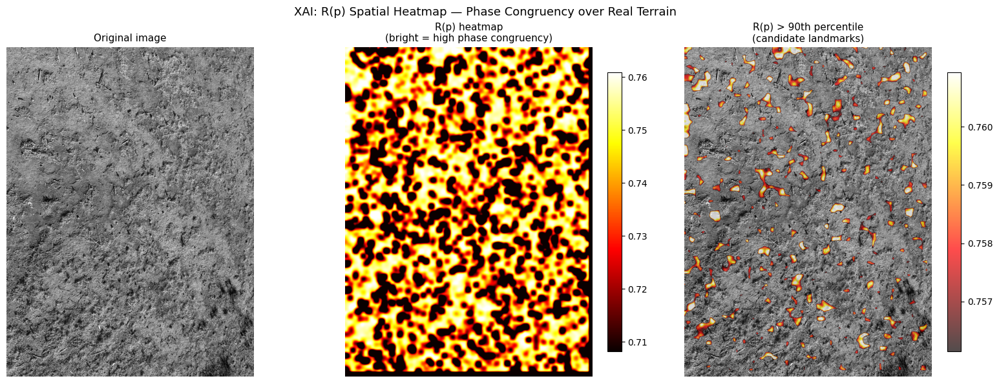

Saved to /content/drive/MyDrive/trn_labeler/prototype_out/xai_rp_heatmap_full.png


In [64]:
# Cell 14 — XAI: Full-image R(p) heatmap (smoothed)
from scipy.ndimage import gaussian_filter

FULL_IMAGE_PATH = "/content/drive/MyDrive/trn_labeler/IMG_7964.HEIC"

img_full = np.array(Image.open(FULL_IMAGE_PATH).convert('L')) / 255.0
print(f"Full image shape: {img_full.shape}")

# Dense grid R(p)
patches_gray, patches_rgb, centers = extract_grid_patches(
    img_full,
    Image.open(FULL_IMAGE_PATH).convert('RGB'),
    patch_size=64,
    stride=32
)

print(f"Computing R(p) for {len(patches_gray)} patches...")
rp_grid = []
for i, pg in enumerate(patches_gray):
    rp, _, _, _ = compute_rp(pg)
    rp_grid.append(rp)
    if (i+1) % 200 == 0:
        print(f"  {i+1}/{len(patches_gray)}")

# Reconstruct spatial heatmap
H, W = img_full.shape
heatmap = np.zeros((H, W))
counts  = np.zeros((H, W))
half    = 32

for (cx, cy), rp in zip(centers, rp_grid):
    heatmap[cy-half:cy+half, cx-half:cx+half] += rp
    counts [cy-half:cy+half, cx-half:cx+half] += 1

counts[counts == 0] = 1
heatmap /= counts

# Increase sigma to match stride scale
heatmap_smooth = gaussian_filter(heatmap, sigma=16)

# More aggressive percentile clip to force contrast
valid  = heatmap_smooth[heatmap_smooth > 0]
vmin   = np.percentile(valid, 25)
vmax   = np.percentile(valid, 99)

threshold     = np.percentile(valid, 90)
landmark_mask = np.where(heatmap_smooth >= threshold, heatmap_smooth, np.nan)


# Plot
fig, axes = plt.subplots(1, 3, figsize=(16, 6))
fig.suptitle('XAI: R(p) Spatial Heatmap — Phase Congruency over Real Terrain', fontsize=13)

axes[0].imshow(img_full, cmap='gray')
axes[0].set_title('Original image', fontsize=11)
axes[0].axis('off')

im = axes[1].imshow(heatmap_smooth, cmap='hot', vmin=vmin, vmax=vmax)
axes[1].set_title('R(p) heatmap\n(bright = high phase congruency)', fontsize=11)
axes[1].axis('off')
plt.colorbar(im, ax=axes[1], fraction=0.046)

axes[2].imshow(img_full, cmap='gray')
im2 = axes[2].imshow(landmark_mask, cmap='hot', alpha=0.7, vmin=threshold, vmax=vmax)
axes[2].set_title('R(p) > 90th percentile\n(candidate landmarks)', fontsize=11)
axes[2].axis('off')
plt.colorbar(im2, ax=axes[2], fraction=0.046)

plt.tight_layout()
plt.savefig(OUT_DIR / 'xai_rp_heatmap_full.png', dpi=150, bbox_inches='tight')
plt.show()
print(f"Saved to {OUT_DIR / 'xai_rp_heatmap_full.png'}")

Full image shape: (4032, 3024)
Computing R(p) for 11532 patches...
  200/11532
  400/11532
  600/11532
  800/11532
  1000/11532
  1200/11532
  1400/11532
  1600/11532
  1800/11532
  2000/11532
  2200/11532
  2400/11532
  2600/11532
  2800/11532
  3000/11532
  3200/11532
  3400/11532
  3600/11532
  3800/11532
  4000/11532
  4200/11532
  4400/11532
  4600/11532
  4800/11532
  5000/11532
  5200/11532
  5400/11532
  5600/11532
  5800/11532
  6000/11532
  6200/11532
  6400/11532
  6600/11532
  6800/11532
  7000/11532
  7200/11532
  7400/11532
  7600/11532
  7800/11532
  8000/11532
  8200/11532
  8400/11532
  8600/11532
  8800/11532
  9000/11532
  9200/11532
  9400/11532
  9600/11532
  9800/11532
  10000/11532
  10200/11532
  10400/11532
  10600/11532
  10800/11532
  11000/11532
  11200/11532
  11400/11532


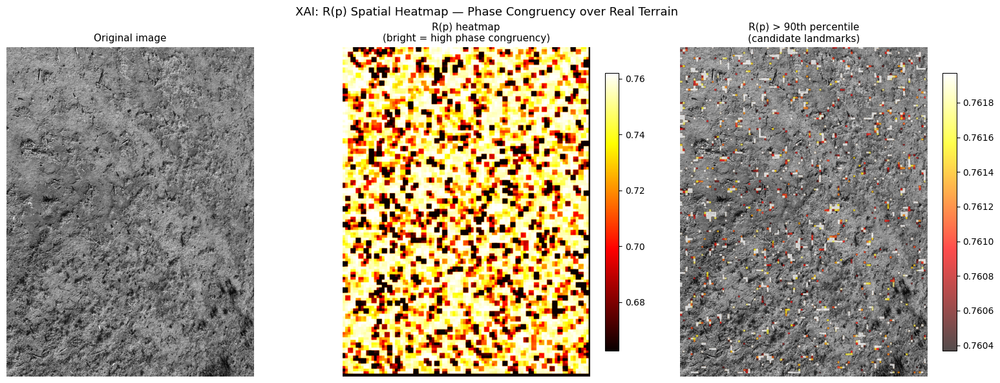

Saved to /content/drive/MyDrive/trn_labeler/prototype_out/xai_rp_heatmap_full.png


In [63]:
# Cell 14 — XAI: Full-image R(p) heatmap (smoothed)
from scipy.ndimage import gaussian_filter

FULL_IMAGE_PATH = "/content/drive/MyDrive/trn_labeler/IMG_7964.HEIC"

img_full = np.array(Image.open(FULL_IMAGE_PATH).convert('L')) / 255.0
print(f"Full image shape: {img_full.shape}")

# Dense grid R(p)
patches_gray, patches_rgb, centers = extract_grid_patches(
    img_full,
    Image.open(FULL_IMAGE_PATH).convert('RGB'),
    patch_size=64,
    stride=32
)

print(f"Computing R(p) for {len(patches_gray)} patches...")
rp_grid = []
for i, pg in enumerate(patches_gray):
    rp, _, _, _ = compute_rp(pg)
    rp_grid.append(rp)
    if (i+1) % 200 == 0:
        print(f"  {i+1}/{len(patches_gray)}")

# Reconstruct spatial heatmap
H, W = img_full.shape
heatmap = np.zeros((H, W))
counts  = np.zeros((H, W))
half    = 32

for (cx, cy), rp in zip(centers, rp_grid):
    heatmap[cy-half:cy+half, cx-half:cx+half] += rp
    counts [cy-half:cy+half, cx-half:cx+half] += 1

counts[counts == 0] = 1
heatmap /= counts

# Smooth to remove checkerboard artifact
heatmap_smooth = gaussian_filter(heatmap, sigma=2)

# Percentile normalization
valid     = heatmap_smooth[heatmap_smooth > 0]
vmin      = np.percentile(valid, 10)
vmax      = np.percentile(valid, 95)

# Sparse landmark mask — top 10%
threshold     = np.percentile(valid, 90)
landmark_mask = np.where(heatmap_smooth >= threshold, heatmap_smooth, np.nan)

# Plot
fig, axes = plt.subplots(1, 3, figsize=(16, 6))
fig.suptitle('XAI: R(p) Spatial Heatmap — Phase Congruency over Real Terrain', fontsize=13)

axes[0].imshow(img_full, cmap='gray')
axes[0].set_title('Original image', fontsize=11)
axes[0].axis('off')

im = axes[1].imshow(heatmap_smooth, cmap='hot', vmin=vmin, vmax=vmax)
axes[1].set_title('R(p) heatmap\n(bright = high phase congruency)', fontsize=11)
axes[1].axis('off')
plt.colorbar(im, ax=axes[1], fraction=0.046)

axes[2].imshow(img_full, cmap='gray')
im2 = axes[2].imshow(landmark_mask, cmap='hot', alpha=0.7, vmin=threshold, vmax=vmax)
axes[2].set_title('R(p) > 90th percentile\n(candidate landmarks)', fontsize=11)
axes[2].axis('off')
plt.colorbar(im2, ax=axes[2], fraction=0.046)

plt.tight_layout()
plt.savefig(OUT_DIR / 'xai_rp_heatmap_full.png', dpi=150, bbox_inches='tight')
plt.show()
print(f"Saved to {OUT_DIR / 'xai_rp_heatmap_full.png'}")

In [48]:
from scipy import stats

# Extract existing metadata signals
entropy_oh = [l['metadata'].get('overhead', {}).get('entropy_H') for l in labels]
svd_oh     = [l['metadata'].get('overhead', {}).get('svd_rank') for l in labels]
grad_oh    = [l['metadata'].get('overhead', {}).get('grad_mag') for l in labels]

df['entropy_H'] = entropy_oh
df['svd_rank']  = svd_oh
df['grad_mag']  = grad_oh

print("Spearman correlation with retrieval rank:")
for col in ['pc_mean', 'entropy_H', 'svd_rank', 'grad_mag']:
    if df[col].isna().any():
        print(f"  {col:12s}  — missing values, skipping")
        continue
    rho, p = stats.spearmanr(df[col], df['rank'])
    print(f"  {col:12s}  r={rho:.3f}  p={p:.3f}")

Spearman correlation with retrieval rank:
  pc_mean       r=-0.278  p=0.023
  entropy_H     r=-0.212  p=0.085
  svd_rank      r=-0.144  p=0.246
  grad_mag      r=0.092  p=0.457


In [49]:
import cv2
from skimage.feature import local_binary_pattern
from skimage.filters import sobel
from scipy import stats

def compute_all_signals(patch_gray):
    img = (patch_gray * 255).astype(np.uint8)

    # LBP — illumination invariant texture
    lbp = local_binary_pattern(img, P=8, R=1, method='uniform')
    lbp_entropy = stats.entropy(np.histogram(lbp, bins=10)[0] + 1e-8)

    # Harris corner response
    harris = cv2.cornerHarris(img, blockSize=4, ksize=3, k=0.04)
    harris_mean = float(np.mean(np.clip(harris, 0, None)))

    # Autocorrelation decay (mean similarity to 1-pixel shifted version)
    shift1 = np.roll(patch_gray, 1, axis=0)
    autocorr = float(np.corrcoef(patch_gray.flatten(), shift1.flatten())[0,1])

    # Laplacian (sharpness/focus measure)
    lap = cv2.Laplacian(img, cv2.CV_64F)
    laplacian_var = float(lap.var())

    # Coefficient of variation (normalized contrast)
    cv_score = float(patch_gray.std() / (patch_gray.mean() + 1e-8))

    return {
        'lbp_entropy'  : lbp_entropy,
        'harris_mean'  : harris_mean,
        'autocorr'     : autocorr,
        'laplacian_var': laplacian_var,
        'cv_score'     : cv_score,
    }

# Run on all overhead patches
extra_signals = [compute_all_signals(pg) for pg in oh_gray_list]
for key in extra_signals[0].keys():
    df[key] = [s[key] for s in extra_signals]

# Compare all signals
print("Spearman correlation with retrieval rank:")
all_cols = ['pc_mean', 'entropy_H', 'svd_rank', 'grad_mag',
            'lbp_entropy', 'harris_mean', 'autocorr', 'laplacian_var', 'cv_score']
for col in all_cols:
    if col not in df or df[col].isna().any():
        continue
    rho, p = stats.spearmanr(df[col], df['rank'])
    sig = '✅' if p < 0.05 else '  '
    print(f"  {sig} {col:16s}  r={rho:.3f}  p={p:.3f}")

Spearman correlation with retrieval rank:
  ✅ pc_mean           r=-0.278  p=0.023
     entropy_H         r=-0.212  p=0.085
     svd_rank          r=-0.144  p=0.246
     grad_mag          r=0.092  p=0.457
     lbp_entropy       r=-0.083  p=0.504
     harris_mean       r=-0.058  p=0.641
     autocorr          r=-0.181  p=0.142
     laplacian_var     r=0.119  p=0.337
     cv_score          r=0.080  p=0.520


In [ ]:
# Cell 11 — Visualisation: R(p) heatmap + match outcomes for one pair
# Green dot = top-1 success, Red dot = failure, circle size ∝ R(p)

VIZ_PAIR_IDX = 0   # change to visualise a different pair

oh_name, rv_name = IMAGE_PAIRS[VIZ_PAIR_IDX]
pair_results = [r for r in all_results if r['oh_name']==oh_name]

if not pair_results:
    print('No results for this pair — run Cell 9 first')
else:
    oh_rgb_viz, oh_gray_viz = load_image(oh_name)
    rv_rgb_viz, rv_gray_viz = load_image(rv_name)

    # Rebuild R(p) heatmap for overlay
    rp_grid_path = OUT_DIR / f'rp_grid_{oh_name}.npy'
    centres_path = OUT_DIR / f'centres_{oh_name}.npy'

    if rp_grid_path.exists():
        rp_grid   = np.load(rp_grid_path)
        grid_cent = np.load(centres_path)

        # Build 2D heatmap
        H, W = oh_gray_viz.shape
        heatmap = np.zeros((H, W))
        count   = np.zeros((H, W))
        half = PATCH_SIZE // 2
        for (cx, cy), rp in zip(grid_cent, rp_grid):
            cx, cy = int(cx), int(cy)
            y0, y1 = max(0,cy-half), min(H,cy+half)
            x0, x1 = max(0,cx-half), min(W,cx+half)
            heatmap[y0:y1, x0:x1] += rp
            count[y0:y1, x0:x1]   += 1
        mask = count > 0
        heatmap[mask] /= count[mask]

        fig, axes = plt.subplots(1, 2, figsize=(18, 8))

        # Left: overhead with R(p) heatmap
        ax = axes[0]
        ax.imshow(oh_rgb_viz)
        im = ax.imshow(heatmap, cmap='hot', alpha=0.45, vmin=0)
        plt.colorbar(im, ax=ax, fraction=0.03, label='R(p)')

        for r in pair_results:
            cx, cy = r['oh_xy']
            rp_val = r['rp']
            color = '#00cc44' if r['success_top1'] else '#ff3333'
            size  = 80 + 200 * rp_val   # larger circle = higher R(p)
            ax.scatter(cx, cy, s=size, c=color, edgecolors='white', linewidths=1.5,
                       alpha=0.9, zorder=5)
            ax.text(cx+4, cy-4, str(r['lm_id']), color='white', fontsize=7,
                    fontweight='bold', zorder=6)

        ax.set_title(f'Overhead: {oh_name}\nR(p) heatmap + match outcomes (circle size ∝ R(p))',
                     fontsize=11)
        green_patch = mpatches.Patch(color='#00cc44', label='Top-1 success')
        red_patch   = mpatches.Patch(color='#ff3333', label='Top-1 failure')
        ax.legend(handles=[green_patch, red_patch], loc='upper right', fontsize=9)
        ax.axis('off')

        # Right: rover image with retrieved match locations
        ax2 = axes[1]
        ax2.imshow(rv_rgb_viz)
        for r in pair_results:
            rx, ry = r['rv_xy']
            color = '#00cc44' if r['success_top1'] else '#ff3333'
            ax2.scatter(rx, ry, s=120, c=color, edgecolors='white',
                        linewidths=1.5, alpha=0.9, zorder=5)
            ax2.text(rx+4, ry-4, str(r['lm_id']), color='white', fontsize=7,
                     fontweight='bold', zorder=6)
        ax2.set_title(f'Rover: {rv_name}\nTrue landmark locations', fontsize=11)
        ax2.axis('off')

        plt.suptitle(
            f'Top-1 accuracy: {np.mean([r["success_top1"] for r in pair_results]):.2f}  |  '
            f'Mean R(p) successes: {np.mean([r["rp"] for r in pair_results if r["success_top1"]]):.3f}  |  '
            f'Mean R(p) failures: {np.mean([r["rp"] for r in pair_results if not r["success_top1"]]):.3f}',
            fontsize=11, y=1.01
        )
        plt.tight_layout()
        savepath = OUT_DIR / f'viz_{oh_name}.png'
        plt.savefig(savepath, dpi=150, bbox_inches='tight')
        plt.show()
        print(f'Saved: {savepath}')
    else:
        print('R(p) grid not found — re-run Cell 9 without cache')

In [ ]:
# Cell 12 — R(p) vs rank scatter plot (the money figure)
# If R(p) predicts matchability, high-R(p) landmarks should have low rank

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

signals = [
    ('R(p)',     rp_vals),
    ('PC_mean',  pcm_vals),
    ('PC_iso',   pci_vals),
]

for ax, (name, vals) in zip(axes, signals):
    colors = ['#00cc44' if s else '#ff3333' for s in top1_labels]
    ax.scatter(vals, np.log1p(ranks), c=colors, alpha=0.7, s=60, edgecolors='white', lw=0.5)

    # Regression line
    z = np.polyfit(vals, np.log1p(ranks), 1)
    xline = np.linspace(vals.min(), vals.max(), 100)
    ax.plot(xline, np.polyval(z, xline), 'k--', lw=1.5, alpha=0.6)

    r, p = pearsonr(vals, np.log1p(ranks))
    ax.set_xlabel(name, fontsize=12)
    ax.set_ylabel('log(rank of true match)', fontsize=12)
    ax.set_title(f'{name} vs retrieval rank\nr={r:.3f}, p={p:.3f}', fontsize=11)
    green_patch = mpatches.Patch(color='#00cc44', label='Top-1 hit')
    red_patch   = mpatches.Patch(color='#ff3333', label='Top-1 miss')
    ax.legend(handles=[green_patch, red_patch], fontsize=8)

plt.suptitle('Phase congruency signals vs DINOv2 retrieval rank\n'
             '(negative correlation = high R(p) → true match found at lower rank)', fontsize=12)
plt.tight_layout()
savepath = OUT_DIR / 'rp_vs_rank.png'
plt.savefig(savepath, dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {savepath}')

In [ ]:
# Cell 13 — Threshold analysis: if we only attempt matches on high-R(p) patches,
# what is the precision-coverage tradeoff?
# This is the operational mitigation: use R(p) to pre-filter the landmark pool.

thresholds = np.percentile(rp_vals, np.arange(0, 90, 5))

coverages, precisions = [], []
for thresh in thresholds:
    mask = rp_vals >= thresh
    coverage = mask.mean()
    if mask.sum() == 0:
        continue
    precision = top1_labels[mask].mean()
    coverages.append(coverage)
    precisions.append(precision)

fig, ax = plt.subplots(figsize=(8, 5))
ax.plot(coverages, precisions, 'o-', color='#2E75B6', lw=2, ms=7)
ax.axhline(top1_labels.mean(), color='gray', linestyle='--', lw=1.5,
           label=f'Baseline (no filter): {top1_labels.mean():.3f}')
ax.set_xlabel('Coverage (fraction of landmarks attempted)', fontsize=12)
ax.set_ylabel('Top-1 Precision', fontsize=12)
ax.set_title('R(p) pre-filter: precision vs coverage tradeoff\n'
             'High R(p) threshold → fewer attempts, higher precision', fontsize=11)
ax.legend(fontsize=10)
ax.set_xlim(0, 1.05)
ax.grid(alpha=0.3)
plt.tight_layout()
savepath = OUT_DIR / 'precision_coverage.png'
plt.savefig(savepath, dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {savepath}')

In [ ]:
# Cell 14 — Summary table across all pairs
from collections import defaultdict

print(f'{'Pair':<40} {'N':>4} {'Top-1':>6} {'Top-k':>6} {'Mean R(p)':>10} {'AUC':>6}')
print('-' * 75)

for oh_name, rv_name in IMAGE_PAIRS:
    pr = [r for r in all_results if r['oh_name']==oh_name]
    if not pr:
        continue
    n      = len(pr)
    top1   = np.mean([r['success_top1'] for r in pr])
    topk   = np.mean([r['success_topk'] for r in pr])
    mean_rp = np.mean([r['rp'] for r in pr])
    rp_p    = np.array([r['rp'] for r in pr])
    lab_p   = np.array([r['success_top1'] for r in pr])
    try:
        auc = roc_auc_score(lab_p, rp_p) if lab_p.sum() > 0 and lab_p.sum() < n else float('nan')
    except:
        auc = float('nan')
    pair_str = f'{oh_name} <-> {rv_name}'
    print(f'{pair_str:<40} {n:>4} {top1:>6.3f} {topk:>6.3f} {mean_rp:>10.4f} {auc:>6.3f}')

print('-' * 75)
print(f'{'TOTAL':<40} {len(all_results):>4} '
      f'{top1_labels.mean():>6.3f} {topk_labels.mean():>6.3f} '
      f'{rp_vals.mean():>10.4f}')

In [ ]:
# Cell 15 — Failure analysis: what do failed matches look like?
# Show the 6 highest-R(p) failures vs 6 lowest-R(p) successes
# This tells you whether R(p) is failing on a systematic terrain type

failures = [r for r in all_results if not r['success_top1']]
successes = [r for r in all_results if r['success_top1']]

failures.sort(key=lambda r: r['rp'], reverse=True)   # worst: high R(p), still failed
successes.sort(key=lambda r: r['rp'])                  # interesting: low R(p), still succeeded

def show_patch_strip(records, title, n=6):
    records = records[:n]
    if not records:
        print(f'{title}: no records')
        return
    fig, axes = plt.subplots(2, len(records), figsize=(3*len(records), 6))
    for i, r in enumerate(records):
        oh_rgb_v, _ = load_image(r['oh_name'])
        rv_rgb_v, _ = load_image(r['rv_name'])
        cx, cy = int(r['oh_xy'][0]), int(r['oh_xy'][1])
        rx, ry = int(r['rv_xy'][0]), int(r['rv_xy'][1])
        half = PATCH_SIZE // 2
        oh_crop = oh_rgb_v.crop((cx-half, cy-half, cx+half, cy+half))
        rv_crop = rv_rgb_v.crop((rx-half, ry-half, rx+half, ry+half))
        axes[0, i].imshow(oh_crop)
        axes[0, i].set_title(f'R(p)={r["rp"]:.3f}\nrank={r["rank"]}', fontsize=8)
        axes[0, i].axis('off')
        axes[1, i].imshow(rv_crop)
        axes[1, i].set_title(f'True rover\n{r["lm_id"]}', fontsize=8)
        axes[1, i].axis('off')
    axes[0, 0].set_ylabel('Overhead', fontsize=9)
    axes[1, 0].set_ylabel('Rover', fontsize=9)
    plt.suptitle(title, fontsize=11)
    plt.tight_layout()
    plt.show()

show_patch_strip(failures,  'High-R(p) failures (should have matched but did not)')
show_patch_strip(successes, 'Low-R(p) successes (should not have matched but did)')

Extracted 67 attention maps.


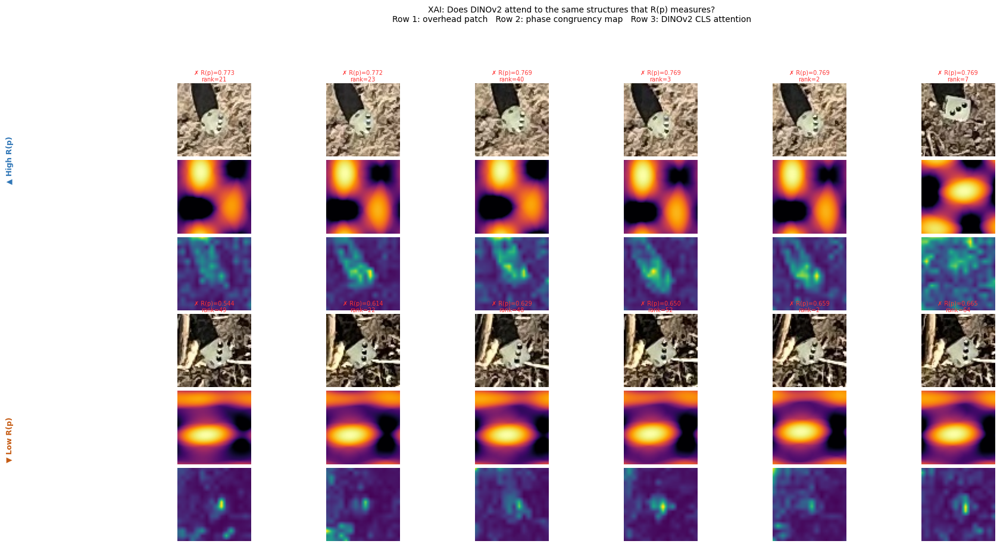

Saved: /content/drive/MyDrive/trn_labeler/prototype_out/xai_attention_vs_rp.png


In [24]:
# Cell 16 — XAI: DINOv2 attention maps vs R(p) (torch.hub compatible)

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy.ndimage import zoom

# ── 1. Build lookup ───────────────────────────────────────────────────────────
label_lookup = {entry['landmark_id']: entry for entry in labels}

# ── 2. Hook QKV projection to reconstruct attention weights ──────────────────
# Works on any ViT regardless of DINOv2 version — no get_last_selfattention needed.
qkv_store = {}

def _qkv_hook(module, inp, out):
    qkv_store['qkv'] = out.detach().cpu()

hook_handle = dino.blocks[-1].attn.qkv.register_forward_hook(_qkv_hook)

def get_attention_map(pil_img):
    """Returns mean CLS attention map upsampled to (64,64)."""
    with torch.no_grad():
        tensor = dino_transform(pil_img.convert('RGB')).unsqueeze(0).to(device)
        _ = dino(tensor)

    # Reconstruct attention from stored QKV
    qkv = qkv_store['qkv']                      # (1, N+1, 3*H*D)
    B, N, C = qkv.shape
    num_heads = dino.blocks[-1].attn.num_heads
    head_dim  = C // (3 * num_heads)
    scale     = head_dim ** -0.5

    qkv = qkv.reshape(B, N, 3, num_heads, head_dim).permute(2, 0, 3, 1, 4)
    q, k = qkv[0], qkv[1]                       # (B, H, N+1, head_dim)

    attn = (q @ k.transpose(-2, -1)) * scale     # (B, H, N+1, N+1)
    attn = attn.softmax(dim=-1)

    # CLS token (row 0) attending to patch tokens (cols 1:)
    n_patches_1d = int((N - 1) ** 0.5)           # 16 for ViT-S/14 at 224px
    cls_attn = attn[0, :, 0, 1:].mean(0).numpy() # (256,)
    attn_map = cls_attn.reshape(n_patches_1d, n_patches_1d)
    scale_factor = 64 / n_patches_1d
    return zoom(attn_map, scale_factor, order=1)  # (64, 64)

# ── 3. Extract maps for all labeled pairs ─────────────────────────────────────
records = []
for res in all_results:
    lm_id = res['landmark_id']
    if lm_id not in label_lookup:
        continue
    entry = label_lookup[lm_id]
    oh_rgb, oh_gray = load_image(entry['overhead_path'])

    attn_map_up      = get_attention_map(oh_rgb)
    pc_map, _ = phase_congruency(oh_gray,
                                 n_scales=PC_N_SCALES,
                                 n_orient=PC_N_ORIENT,
                                 min_wavelength=PC_MIN_WAVE,
                                 mult=PC_MULT,
                                 sigma_on_f=PC_SIGMA_ON_F,
                                 noise_method=PC_NOISE_METHOD)

    records.append({
        'landmark_id' : lm_id,
        'rp'          : res['rp'],
        'rank'        : res['rank'],
        'success'     : res['success_top1'],
        'oh_rgb'      : oh_rgb,
        'pc_map'      : pc_map,
        'attn_map'    : attn_map_up,
    })

hook_handle.remove()
print(f'Extracted {len(records)} attention maps.')

# ── 4. Sort and select extremes ───────────────────────────────────────────────
records.sort(key=lambda r: r['rp'])
low_rp  = records[:6]
high_rp = records[-6:][::-1]

# ── 5. Plot ───────────────────────────────────────────────────────────────────
N_SHOW = 6
fig = plt.figure(figsize=(N_SHOW * 3.2, 10))
gs  = gridspec.GridSpec(6, N_SHOW, figure=fig, hspace=0.05, wspace=0.05)
row_labels = ['Overhead patch', 'PC map  R(p)', 'DINOv2 attention']

def _plot_group(row_offset, group):
    for col, rec in enumerate(group):
        layers = [
            (np.array(rec['oh_rgb']), 'gray',    None, None),
            (rec['pc_map'],            'inferno', 0,    None),
            (rec['attn_map'],          'viridis', 0,    None),
        ]
        for sub_row, (img, cmap, vmin, vmax) in enumerate(layers):
            ax = fig.add_subplot(gs[row_offset + sub_row, col])
            ax.imshow(img, cmap=cmap, vmin=vmin, vmax=vmax)
            ax.axis('off')
            if col == 0:
                ax.set_ylabel(row_labels[sub_row], fontsize=8,
                              rotation=90, labelpad=4, va='center')
            if sub_row == 0:
                outcome = '✓' if rec['success'] else '✗'
                color   = '#00cc44' if rec['success'] else '#ff3333'
                ax.set_title(f"{outcome} R(p)={rec['rp']:.3f}\nrank={rec['rank']}",
                             fontsize=7, color=color, pad=2)

_plot_group(0, high_rp)
_plot_group(3, low_rp)

fig.text(0.005, 0.75, '▲ High R(p)', fontsize=9, fontweight='bold',
         va='center', color='#2E75B6', rotation=90)
fig.text(0.005, 0.28, '▼ Low R(p)', fontsize=9, fontweight='bold',
         va='center', color='#C55A11', rotation=90)

fig.suptitle(
    'XAI: Does DINOv2 attend to the same structures that R(p) measures?\n'
    'Row 1: overhead patch   Row 2: phase congruency map   Row 3: DINOv2 CLS attention',
    fontsize=10, y=1.01
)

savepath = OUT_DIR / 'xai_attention_vs_rp.png'
plt.savefig(savepath, dpi=180, bbox_inches='tight')
plt.show()
print(f'Saved: {savepath}')

In [26]:
# Check HEIC loading capability
try:
    from pillow_heif import register_heif_opener
    register_heif_opener()
    print("pillow_heif available — HEIC supported")
    HEIC_OK = True
except ImportError:
    print("pillow_heif not installed — will need to install or convert")
    HEIC_OK = False

pillow_heif available — HEIC supported


Loaded 67 landmark records with pixel coordinates.
Found 8 unique overhead images.
IMG_7968.HEIC  (3024×4032)  14 landmarks


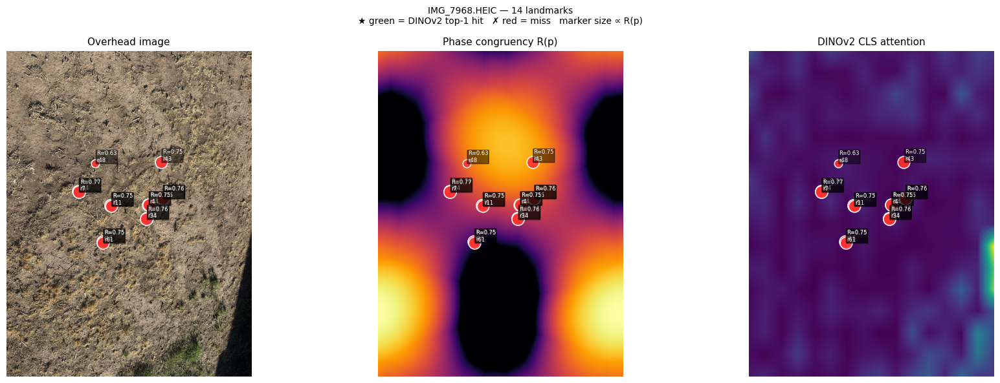

  Saved: /content/drive/MyDrive/trn_labeler/prototype_out/xai_fullimg_IMG_7968.png
IMG_7964.HEIC  (3024×4032)  8 landmarks


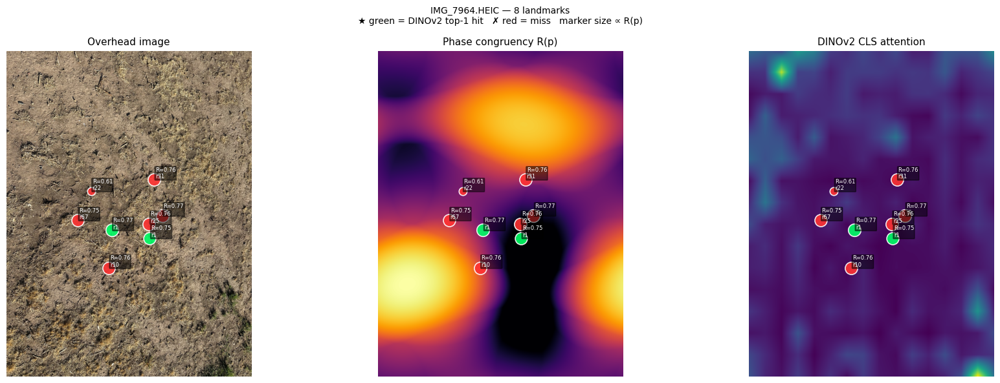

  Saved: /content/drive/MyDrive/trn_labeler/prototype_out/xai_fullimg_IMG_7964.png
IMG_7965.HEIC  (3024×4032)  8 landmarks


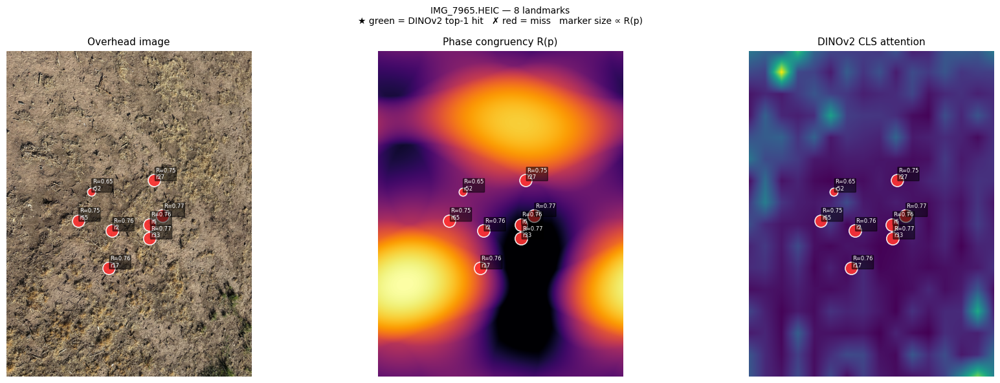

  Saved: /content/drive/MyDrive/trn_labeler/prototype_out/xai_fullimg_IMG_7965.png
IMG_7966.HEIC  (3024×4032)  8 landmarks


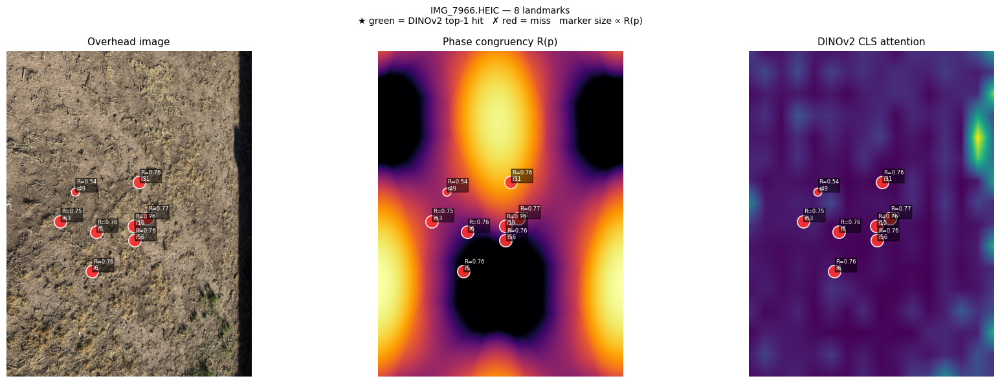

  Saved: /content/drive/MyDrive/trn_labeler/prototype_out/xai_fullimg_IMG_7966.png
Done.


In [27]:
# Cell 17 — XAI on full images: DINOv2 attention + PC heatmap
# with labeled landmark locations overlaid
# Uses pixel_xy from metadata.json to place landmarks on full-res images

import json
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from pathlib import Path
from PIL import Image
from scipy.ndimage import zoom

EARTH_PAIRS_DIR = Path(EARTH_PAIRS_DIR)
BASE_DIR = Path('/content/drive/MyDrive/trn_labeler')

# ── 1. Rebuild landmark list with pixel_xy from metadata.json ─────────────────
lm_records = []  # one entry per landmark directory
for lm_dir in sorted(EARTH_PAIRS_DIR.iterdir()):
    if not lm_dir.is_dir():
        continue
    meta_path = lm_dir / 'metadata.json'
    if not meta_path.exists():
        continue
    with open(meta_path) as f:
        meta = json.load(f)

    # Match to existing all_results for R(p) and retrieval outcome
    lm_id = meta.get('pair_id', lm_dir.name)
    match = next((r for r in all_results if r['landmark_id'] == lm_dir.name), None)

    lm_records.append({
        'lm_dir'      : lm_dir,
        'pair_id'     : lm_id,
        'oh_image'    : BASE_DIR / meta['overhead']['image'].lstrip('./'),
        'oh_pixel_xy' : tuple(meta['overhead']['pixel_xy']),
        'rp'          : match['rp']      if match else None,
        'success'     : match['success_top1'] if match else None,
        'rank'        : match['rank']    if match else None,
    })

print(f'Loaded {len(lm_records)} landmark records with pixel coordinates.')

# ── 2. Group by overhead image ────────────────────────────────────────────────
from collections import defaultdict
groups = defaultdict(list)
for rec in lm_records:
    groups[rec['oh_image']].append(rec)

print(f'Found {len(groups)} unique overhead images.')

# ── 3. Hook QKV for attention (same as Cell 16) ───────────────────────────────
qkv_store2 = {}
def _qkv_hook2(module, inp, out):
    qkv_store2['qkv'] = out.detach().cpu()
hook2 = dino.blocks[-1].attn.qkv.register_forward_hook(_qkv_hook2)

def get_full_attn_map(pil_img, out_size):
    """Run DINOv2, return CLS attention map resized to out_size=(H,W)."""
    with torch.no_grad():
        tensor = dino_transform(pil_img.convert('RGB')).unsqueeze(0).to(device)
        _ = dino(tensor)
    qkv   = qkv_store2['qkv']
    B, N, C = qkv.shape
    nh    = dino.blocks[-1].attn.num_heads
    hd    = C // (3 * nh)
    scale = hd ** -0.5
    qkv   = qkv.reshape(B, N, 3, nh, hd).permute(2, 0, 3, 1, 4)
    q, k  = qkv[0], qkv[1]
    attn  = (q @ k.transpose(-2,-1) * scale).softmax(-1)
    n1d   = int((N-1)**0.5)
    cls_a = attn[0, :, 0, 1:].mean(0).numpy().reshape(n1d, n1d)
    sy, sx = out_size[0]/n1d, out_size[1]/n1d
    return zoom(cls_a, (sy, sx), order=1)

# ── 4. Plot one figure per overhead image ─────────────────────────────────────
# Sort groups so images with most landmarks come first
sorted_groups = sorted(groups.items(), key=lambda x: -len(x[1]))

for oh_path, landmarks in sorted_groups[:4]:  # limit to 4 images
    if not oh_path.exists():
        print(f'  [SKIP] {oh_path.name} not found')
        continue

    # Load full image
    oh_img = Image.open(oh_path).convert('RGB')
    W, H   = oh_img.size
    oh_arr = np.array(oh_img)
    oh_gray = np.array(oh_img.convert('L')) / 255.0

    print(f'{oh_path.name}  ({W}×{H})  {len(landmarks)} landmarks')

    # Attention map
    attn_map = get_full_attn_map(oh_img, (H, W))

    # PC map — downsample image first or it's very slow
    scale_pc = 512 / max(H, W)
    oh_small = np.array(oh_img.convert('L').resize(
        (int(W*scale_pc), int(H*scale_pc)), Image.LANCZOS)) / 255.0
    pc_small, _ = phase_congruency(oh_small,
                                   n_scales=PC_N_SCALES,
                                   n_orient=PC_N_ORIENT,
                                   min_wavelength=PC_MIN_WAVE,
                                   mult=PC_MULT,
                                   sigma_on_f=PC_SIGMA_ON_F,
                                   noise_method=PC_NOISE_METHOD)
    pc_map = zoom(pc_small, (H/pc_small.shape[0], W/pc_small.shape[1]), order=1)

    # ── Figure ────────────────────────────────────────────────────────────────
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    titles = ['Overhead image', 'Phase congruency R(p)', 'DINOv2 CLS attention']
    imgs   = [oh_arr, pc_map, attn_map]
    cmaps  = [None,   'inferno', 'viridis']

    for ax, img, cmap, title in zip(axes, imgs, cmaps, titles):
        ax.imshow(img, cmap=cmap)
        ax.set_title(title, fontsize=11)
        ax.axis('off')

        # Overlay landmarks
        rp_vals_here = [r['rp'] for r in landmarks if r['rp'] is not None]
        rp_min = min(rp_vals_here) if rp_vals_here else 0
        rp_max = max(rp_vals_here) if rp_vals_here else 1
        rp_range = rp_max - rp_min + 1e-8

        for rec in landmarks:
            x, y = rec['oh_pixel_xy']
            rp   = rec['rp']
            succ = rec['success']

            # Color by success/failure; size by R(p)
            color  = '#00ff66' if succ else '#ff3333'
            marker = '★' if succ else '✗'
            norm_rp = (rp - rp_min) / rp_range if rp is not None else 0.5
            ms = 80 + 120 * norm_rp  # marker size scales with R(p)

            ax.scatter(x, y, s=ms, c=color, edgecolors='white',
                       linewidths=1.2, zorder=5, alpha=0.9)
            ax.text(x+15, y-15,
                    f"R={rp:.2f}\nr{rec['rank']}",
                    color='white', fontsize=6, zorder=6,
                    bbox=dict(boxstyle='round,pad=0.1', fc='black', alpha=0.5))

    fig.suptitle(
        f'{oh_path.name} — {len(landmarks)} landmarks\n'
        '★ green = DINOv2 top-1 hit   ✗ red = miss   marker size ∝ R(p)',
        fontsize=10
    )
    plt.tight_layout()
    savepath = OUT_DIR / f'xai_fullimg_{oh_path.stem}.png'
    plt.savefig(savepath, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'  Saved: {savepath}')

hook2.remove()
print('Done.')

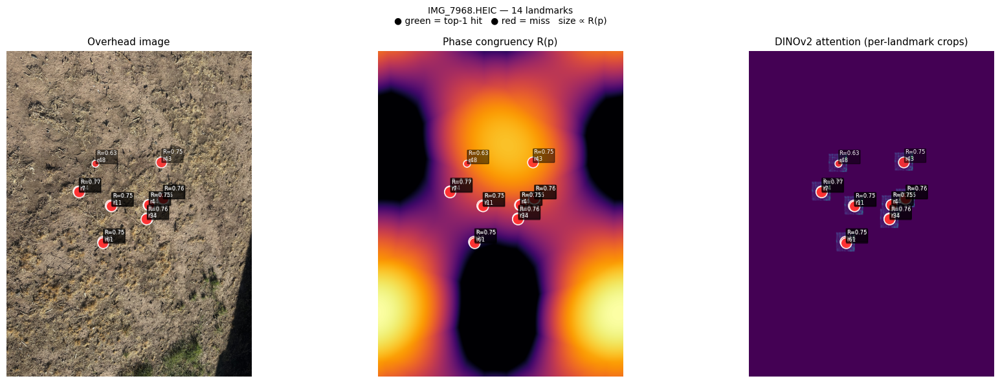

Saved: /content/drive/MyDrive/trn_labeler/prototype_out/xai_fullimg_IMG_7968.png


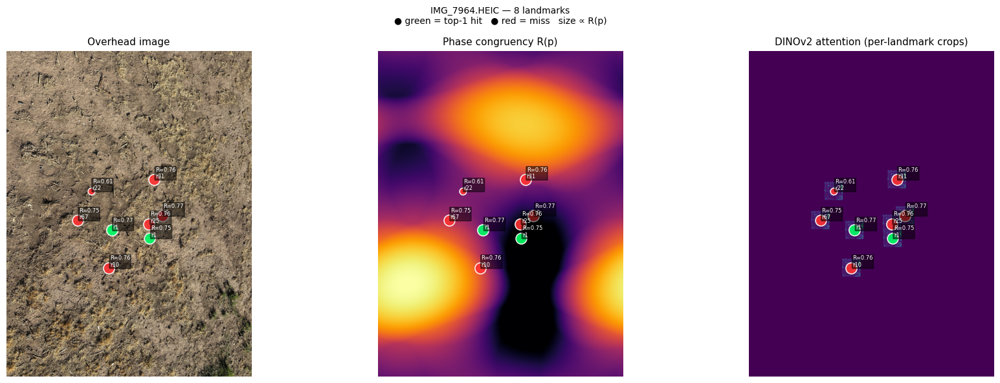

Saved: /content/drive/MyDrive/trn_labeler/prototype_out/xai_fullimg_IMG_7964.png


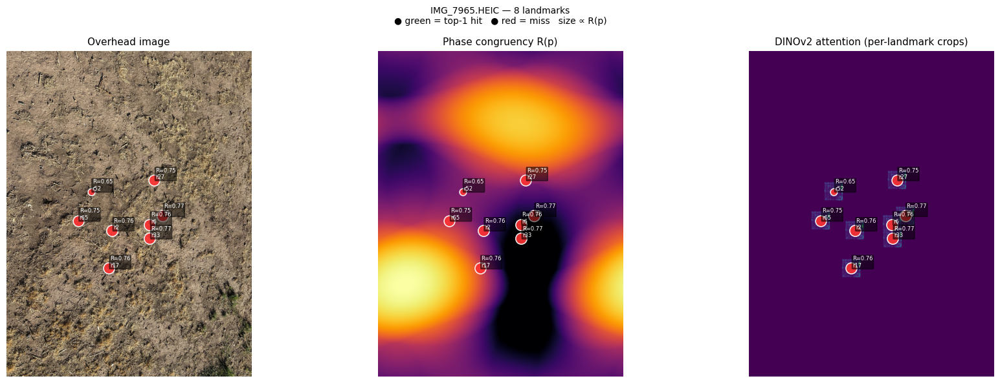

Saved: /content/drive/MyDrive/trn_labeler/prototype_out/xai_fullimg_IMG_7965.png


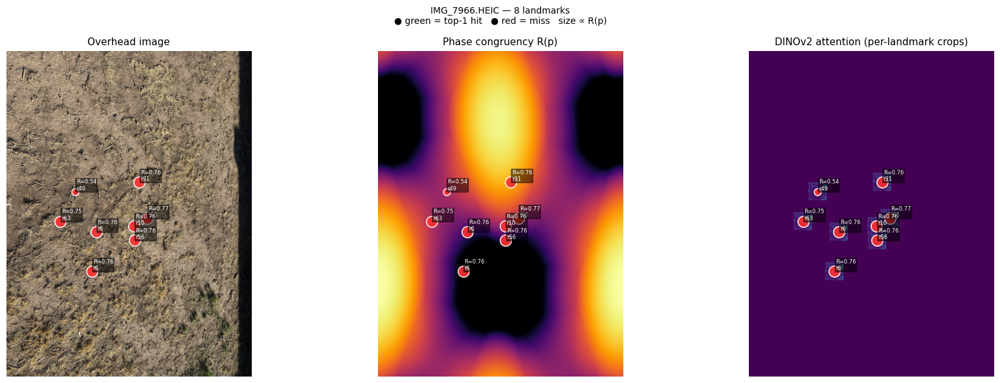

Saved: /content/drive/MyDrive/trn_labeler/prototype_out/xai_fullimg_IMG_7966.png


In [28]:
# Cell 17b — Per-landmark attention crops placed on full image

CROP_SIZE = 224  # pixels around each landmark to feed DINOv2

def get_landmark_attn(oh_img, cx, cy, crop_px=CROP_SIZE):
    """
    Crop a region centred on (cx,cy), run DINOv2 attention,
    return (attn_map, (x0,y0,x1,y1)) — map is in crop coordinates.
    """
    W, H = oh_img.size
    half = crop_px // 2
    x0, y0 = max(0, cx-half), max(0, cy-half)
    x1, y1 = min(W, cx+half), min(H, cy+half)
    crop = oh_img.crop((x0, y0, x1, y1))
    ch, cw = y1-y0, x1-x0

    with torch.no_grad():
        tensor = dino_transform(crop.convert('RGB')).unsqueeze(0).to(device)
        _ = dino(tensor)

    qkv   = qkv_store2['qkv']
    B, N, C = qkv.shape
    nh    = dino.blocks[-1].attn.num_heads
    hd    = C // (3 * nh)
    q, k  = (qkv.reshape(B,N,3,nh,hd).permute(2,0,3,1,4))[:2]
    attn  = (q @ k.transpose(-2,-1) * hd**-0.5).softmax(-1)
    n1d   = int((N-1)**0.5)
    cls_a = attn[0,:,0,1:].mean(0).numpy().reshape(n1d, n1d)

    # Upsample to crop pixel size
    attn_crop = zoom(cls_a, (ch/n1d, cw/n1d), order=1)
    return attn_crop, (x0, y0, x1, y1)


for oh_path, landmarks in sorted_groups[:4]:
    if not oh_path.exists():
        continue

    oh_img  = Image.open(oh_path).convert('RGB')
    W, H    = oh_img.size
    oh_arr  = np.array(oh_img)
    oh_gray = np.array(oh_img.convert('L')) / 255.0

    # Full-image PC map (downsampled for speed)
    scale_pc = 512 / max(H, W)
    oh_small = np.array(oh_img.convert('L').resize(
        (int(W*scale_pc), int(H*scale_pc)), Image.LANCZOS)) / 255.0
    pc_small, _ = phase_congruency(oh_small,
                                   n_scales=PC_N_SCALES, n_orient=PC_N_ORIENT,
                                   min_wavelength=PC_MIN_WAVE, mult=PC_MULT,
                                   sigma_on_f=PC_SIGMA_ON_F,
                                   noise_method=PC_NOISE_METHOD)
    pc_map = zoom(pc_small, (H/pc_small.shape[0], W/pc_small.shape[1]), order=1)

    # Full-image attention canvas — accumulate per-landmark crops
    attn_canvas = np.zeros((H, W), dtype=np.float32)
    attn_count  = np.zeros((H, W), dtype=np.float32)

    for rec in landmarks:
        cx, cy = rec['oh_pixel_xy']
        attn_crop, (x0,y0,x1,y1) = get_landmark_attn(oh_img, cx, cy)
        ch, cw = y1-y0, x1-x0
        attn_canvas[y0:y1, x0:x1] += attn_crop[:ch, :cw]
        attn_count [y0:y1, x0:x1] += 1

    # Average where crops overlapped
    with np.errstate(invalid='ignore'):
        attn_canvas = np.where(attn_count > 0, attn_canvas / attn_count, 0)

    # ── Plot ─────────────────────────────────────────────────────────────────
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    for ax, img, cmap, title in zip(
        axes,
        [oh_arr, pc_map, attn_canvas],
        [None, 'inferno', 'viridis'],
        ['Overhead image', 'Phase congruency R(p)', 'DINOv2 attention (per-landmark crops)']
    ):
        ax.imshow(img, cmap=cmap)
        ax.set_title(title, fontsize=11)
        ax.axis('off')

        rp_vals_here = [r['rp'] for r in landmarks if r['rp'] is not None]
        rp_min, rp_max = min(rp_vals_here), max(rp_vals_here)
        rp_range = rp_max - rp_min + 1e-8

        for rec in landmarks:
            x, y  = rec['oh_pixel_xy']
            color = '#00ff66' if rec['success'] else '#ff3333'
            norm  = (rec['rp'] - rp_min) / rp_range
            ms    = 60 + 100 * norm
            ax.scatter(x, y, s=ms, c=color, edgecolors='white',
                       linewidths=1.2, zorder=5, alpha=0.9)
            ax.text(x+15, y-15, f"R={rec['rp']:.2f}\nr{rec['rank']}",
                    color='white', fontsize=6, zorder=6,
                    bbox=dict(boxstyle='round,pad=0.1', fc='black', alpha=0.5))

    fig.suptitle(
        f'{oh_path.name} — {len(landmarks)} landmarks\n'
        '● green = top-1 hit   ● red = miss   size ∝ R(p)',
        fontsize=10
    )
    plt.tight_layout()
    savepath = OUT_DIR / f'xai_fullimg_{oh_path.stem}.png'
    plt.savefig(savepath, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'Saved: {savepath}')


IMG_7968.HEIC  (3024×4032)  14 landmarks
  Running DINOv2 on 910 tiles (35×26)...


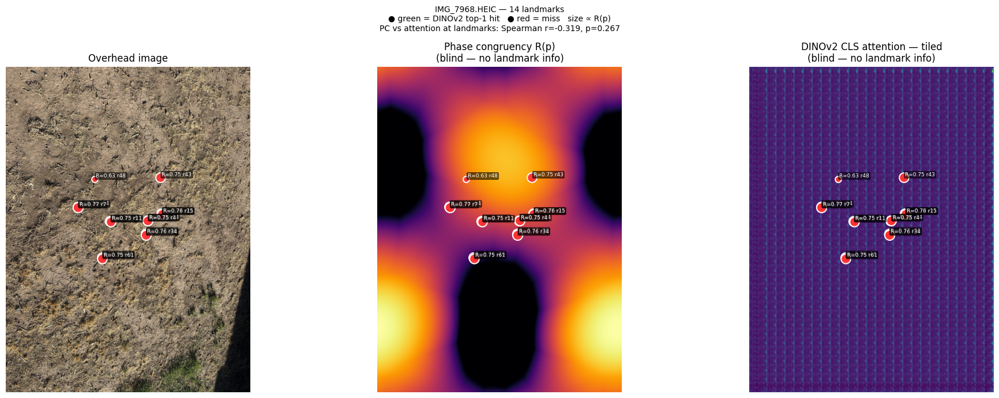

  Saved: /content/drive/MyDrive/trn_labeler/prototype_out/xai_tiled_IMG_7968.png

IMG_7964.HEIC  (3024×4032)  8 landmarks
  Running DINOv2 on 910 tiles (35×26)...


KeyboardInterrupt: 

In [29]:
# Cell 17d — Tiled DINOv2 attention on full image (Option A)
# DINOv2 runs blind on overlapping 224px tiles — no landmark info used.
# Landmark dots are ground truth overlay only, added after.

TILE_SIZE = 224
STRIDE    = 112   # 50% overlap between tiles

def tiled_attention_map(oh_img):
    """
    Divide full image into overlapping 224px tiles.
    Run DINOv2 on each tile, upsample attention to tile size,
    accumulate into a full-res canvas and average overlaps.
    Returns (H, W) float array.
    """
    W, H = oh_img.size
    canvas = np.zeros((H, W), dtype=np.float32)
    counts = np.zeros((H, W), dtype=np.float32)

    ys = list(range(0, H - TILE_SIZE, STRIDE)) + [H - TILE_SIZE]
    xs = list(range(0, W - TILE_SIZE, STRIDE)) + [W - TILE_SIZE]
    ys = sorted(set(max(0, y) for y in ys))
    xs = sorted(set(max(0, x) for x in xs))

    n_tiles = len(ys) * len(xs)
    print(f'  Running DINOv2 on {n_tiles} tiles ({len(ys)}×{len(xs)})...')

    for y0 in ys:
        for x0 in xs:
            x1, y1 = x0 + TILE_SIZE, y0 + TILE_SIZE
            tile = oh_img.crop((x0, y0, x1, y1))

            with torch.no_grad():
                tensor = dino_transform(tile.convert('RGB')).unsqueeze(0).to(device)
                _ = dino(tensor)

            qkv   = qkv_store2['qkv']
            B,N,C = qkv.shape
            nh    = dino.blocks[-1].attn.num_heads
            hd    = C // (3*nh)
            q, k  = (qkv.reshape(B,N,3,nh,hd).permute(2,0,3,1,4))[:2]
            attn  = (q @ k.transpose(-2,-1) * hd**-0.5).softmax(-1)
            n1d   = int((N-1)**0.5)
            cls_a = attn[0,:,0,1:].mean(0).numpy().reshape(n1d, n1d)

            # Upsample to tile pixel size
            attn_tile = zoom(cls_a, TILE_SIZE / n1d, order=1)  # (224, 224)

            canvas[y0:y1, x0:x1] += attn_tile
            counts [y0:y1, x0:x1] += 1

    with np.errstate(invalid='ignore'):
        canvas = np.where(counts > 0, canvas / counts, 0)

    return canvas


# ── Run for up to 4 overhead images ──────────────────────────────────────────
for oh_path, landmarks in sorted_groups[:4]:
    if not oh_path.exists():
        print(f'  [SKIP] {oh_path.name}')
        continue

    oh_img  = Image.open(oh_path).convert('RGB')
    W, H    = oh_img.size
    oh_arr  = np.array(oh_img)
    print(f'\n{oh_path.name}  ({W}×{H})  {len(landmarks)} landmarks')

    # ── PC map (downsampled for speed, then upsampled back) ──────────────────
    scale_pc = 512 / max(H, W)
    oh_small = np.array(oh_img.convert('L').resize(
        (int(W*scale_pc), int(H*scale_pc)), Image.LANCZOS)) / 255.0
    pc_small, _ = phase_congruency(oh_small,
                                   n_scales=PC_N_SCALES, n_orient=PC_N_ORIENT,
                                   min_wavelength=PC_MIN_WAVE, mult=PC_MULT,
                                   sigma_on_f=PC_SIGMA_ON_F,
                                   noise_method=PC_NOISE_METHOD)
    pc_map = zoom(pc_small, (H/pc_small.shape[0], W/pc_small.shape[1]), order=1)

    # ── Tiled DINOv2 attention ────────────────────────────────────────────────
    attn_map = tiled_attention_map(oh_img)

    # ── Landmark overlay helpers ──────────────────────────────────────────────
    rp_vals_here = [r['rp'] for r in landmarks if r['rp'] is not None]
    rp_min  = min(rp_vals_here)
    rp_range = max(rp_vals_here) - rp_min + 1e-8

    def overlay_landmarks(ax):
        for rec in landmarks:
            if rec['rp'] is None:
                continue
            x, y  = rec['oh_pixel_xy']
            color = '#00ff66' if rec['success'] else '#ff3333'
            norm  = (rec['rp'] - rp_min) / rp_range
            ms    = 60 + 100 * norm
            ax.scatter(x, y, s=ms, c=color, edgecolors='white',
                       linewidths=1.5, zorder=5, alpha=0.95)
            ax.text(x+18, y-18,
                    f"R={rec['rp']:.2f} r{rec['rank']}",
                    color='white', fontsize=6.5, zorder=6,
                    bbox=dict(boxstyle='round,pad=0.15', fc='black', alpha=0.55))

    # ── Figure ────────────────────────────────────────────────────────────────
    fig, axes = plt.subplots(1, 3, figsize=(20, 7))

    axes[0].imshow(oh_arr)
    axes[0].set_title('Overhead image', fontsize=12)

    axes[1].imshow(pc_map, cmap='inferno', vmin=0)
    axes[1].set_title('Phase congruency R(p)\n(blind — no landmark info)', fontsize=12)

    axes[2].imshow(attn_map, cmap='viridis', vmin=0)
    axes[2].set_title('DINOv2 CLS attention — tiled\n(blind — no landmark info)', fontsize=12)

    for ax in axes:
        ax.axis('off')
        overlay_landmarks(ax)

    # Correlation between PC map and attention map at landmark locations
    pc_at_lm   = [pc_map  [int(r['oh_pixel_xy'][1]), int(r['oh_pixel_xy'][0])]
                  for r in landmarks if r['rp'] is not None]
    attn_at_lm = [attn_map[int(r['oh_pixel_xy'][1]), int(r['oh_pixel_xy'][0])]
                  for r in landmarks if r['rp'] is not None]
    if len(pc_at_lm) > 2:
        from scipy.stats import spearmanr
        rho, pval = spearmanr(pc_at_lm, attn_at_lm)
        corr_str = f'PC vs attention at landmarks: Spearman r={rho:.3f}, p={pval:.3f}'
    else:
        corr_str = ''

    fig.suptitle(
        f'{oh_path.name} — {len(landmarks)} landmarks\n'
        f'● green = DINOv2 top-1 hit   ● red = miss   size ∝ R(p)\n{corr_str}',
        fontsize=10
    )
    plt.tight_layout()
    savepath = OUT_DIR / f'xai_tiled_{oh_path.stem}.png'
    plt.savefig(savepath, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'  Saved: {savepath}')

hook2.remove()
print('\nDone.')


IMG_7968.HEIC  (3024×4032)  14 valid landmarks


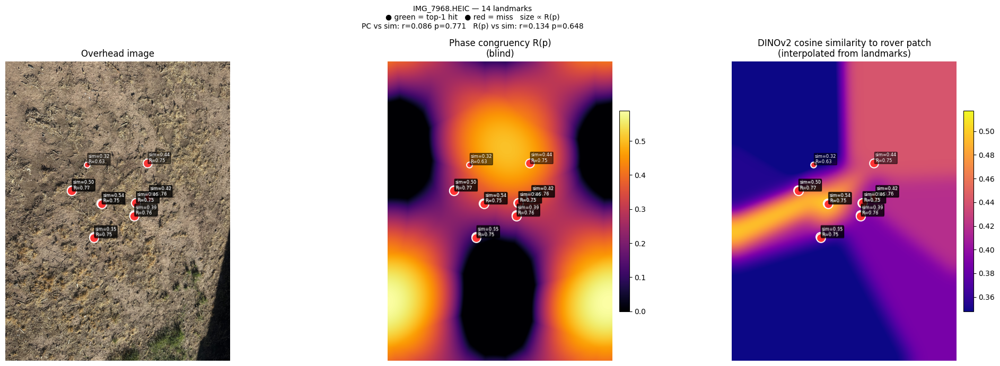

  Saved: /content/drive/MyDrive/trn_labeler/prototype_out/xai_simmap_IMG_7968.png

IMG_7964.HEIC  (3024×4032)  8 valid landmarks


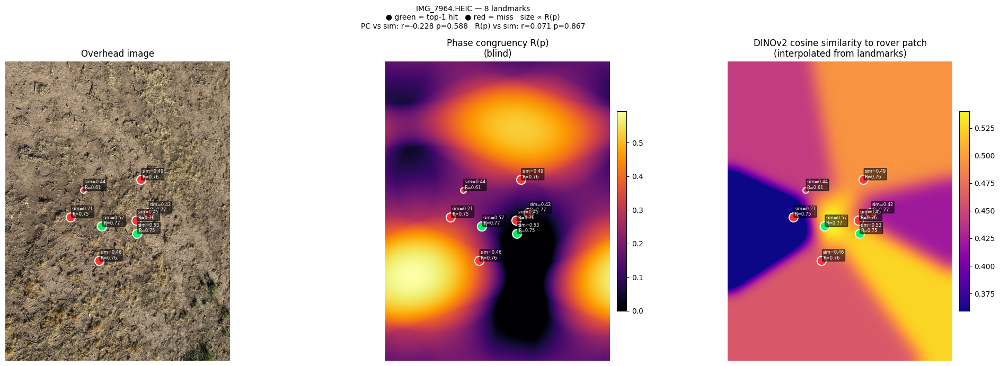

  Saved: /content/drive/MyDrive/trn_labeler/prototype_out/xai_simmap_IMG_7964.png

IMG_7965.HEIC  (3024×4032)  8 valid landmarks


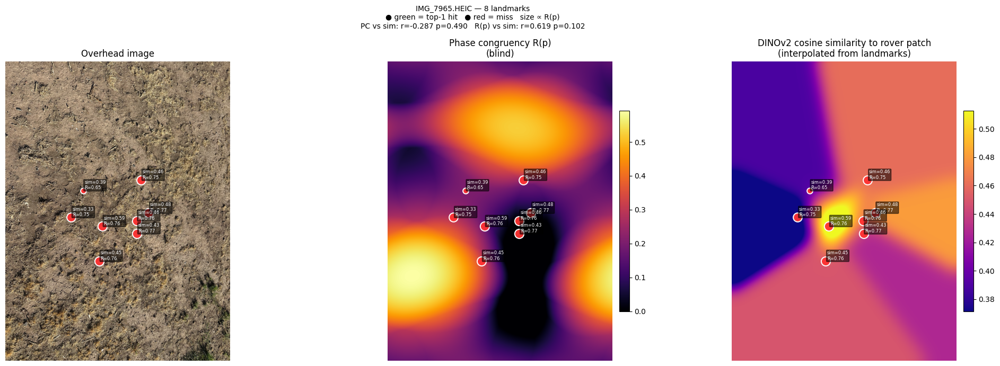

  Saved: /content/drive/MyDrive/trn_labeler/prototype_out/xai_simmap_IMG_7965.png

IMG_7966.HEIC  (3024×4032)  8 valid landmarks


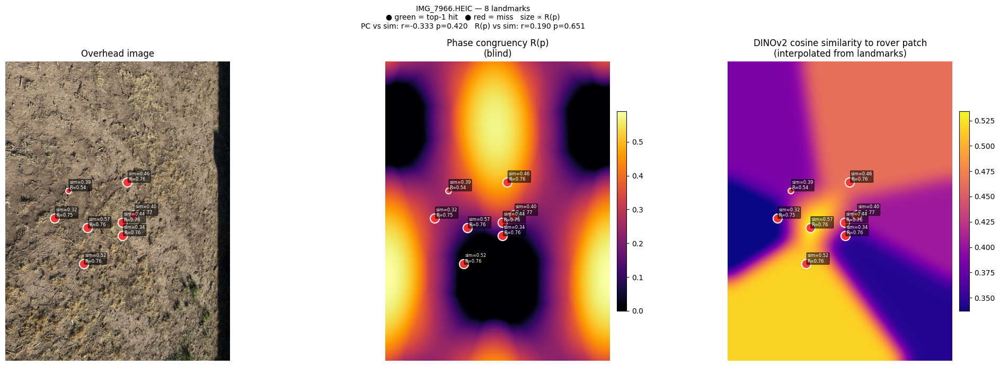

  Saved: /content/drive/MyDrive/trn_labeler/prototype_out/xai_simmap_IMG_7966.png

Done.


In [30]:
# Cell 17e — XAI: spatial cosine similarity map vs PC map
# For each overhead image, interpolate DINOv2 sim_to_true values
# at landmark pixel_xy locations onto a full-image heatmap.
# Both maps are blind — no landmark info used to compute them.
# Landmark dots are ground truth overlay only.

from scipy.interpolate import griddata
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy.ndimage import zoom
from scipy.stats import spearmanr

# ── Merge sim_to_true into lm_records ────────────────────────────────────────
result_lookup = {r['landmark_id']: r for r in all_results}

for rec in lm_records:
    match = result_lookup.get(rec['lm_dir'].name)
    rec['sim_to_true'] = match['sim_to_true'] if match else None
    rec['rp']          = match['rp']          if match else None
    rec['success']     = match['success_top1'] if match else None
    rec['rank']        = match['rank']         if match else None

# ── Plot per overhead image ───────────────────────────────────────────────────
for oh_path, landmarks in sorted_groups[:4]:
    if not oh_path.exists():
        print(f'  [SKIP] {oh_path.name}')
        continue

    # Filter to landmarks with all data
    valid = [r for r in landmarks
             if r['sim_to_true'] is not None and r['oh_pixel_xy'] is not None]
    if len(valid) < 3:
        print(f'  [SKIP] {oh_path.name} — too few landmarks ({len(valid)})')
        continue

    oh_img  = Image.open(oh_path).convert('RGB')
    W, H    = oh_img.size
    oh_arr  = np.array(oh_img)
    print(f'\n{oh_path.name}  ({W}×{H})  {len(valid)} valid landmarks')

    # ── PC map ────────────────────────────────────────────────────────────────
    scale_pc = 512 / max(H, W)
    oh_small = np.array(oh_img.convert('L').resize(
        (int(W*scale_pc), int(H*scale_pc)), Image.LANCZOS)) / 255.0
    pc_small, _ = phase_congruency(oh_small,
                                   n_scales=PC_N_SCALES, n_orient=PC_N_ORIENT,
                                   min_wavelength=PC_MIN_WAVE, mult=PC_MULT,
                                   sigma_on_f=PC_SIGMA_ON_F,
                                   noise_method=PC_NOISE_METHOD)
    pc_map = zoom(pc_small,
                  (H/pc_small.shape[0], W/pc_small.shape[1]), order=1)

    # ── Cosine similarity spatial map (interpolated) ──────────────────────────
    pts  = np.array([r['oh_pixel_xy'] for r in valid])   # (N, 2) — x, y
    sims = np.array([r['sim_to_true'] for r in valid])   # (N,)

    # Dense grid over full image
    grid_x, grid_y = np.meshgrid(np.arange(W), np.arange(H))

    # Interpolate — 'linear' within convex hull, fill outside with nearest
    sim_map_linear  = griddata(pts, sims, (grid_x, grid_y), method='linear')
    sim_map_nearest = griddata(pts, sims, (grid_x, grid_y), method='nearest')
    sim_map = np.where(np.isnan(sim_map_linear), sim_map_nearest, sim_map_linear)

    # Smooth slightly so it reads as a heatmap not a voronoi diagram
    from scipy.ndimage import gaussian_filter
    sim_map = gaussian_filter(sim_map, sigma=max(H, W) / 40)

    # ── Landmark overlay ──────────────────────────────────────────────────────
    rp_vals   = [r['rp'] for r in valid]
    rp_min    = min(rp_vals)
    rp_range  = max(rp_vals) - rp_min + 1e-8

    def overlay_landmarks(ax):
        for rec in valid:
            x, y  = rec['oh_pixel_xy']
            color = '#00ff66' if rec['success'] else '#ff3333'
            norm  = (rec['rp'] - rp_min) / rp_range
            ms    = 60 + 100 * norm
            ax.scatter(x, y, s=ms, c=color, edgecolors='white',
                       linewidths=1.5, zorder=5, alpha=0.95)
            ax.text(x+18, y-18,
                    f"sim={rec['sim_to_true']:.2f}\nR={rec['rp']:.2f}",
                    color='white', fontsize=6, zorder=6,
                    bbox=dict(boxstyle='round,pad=0.15', fc='black', alpha=0.55))

    # ── Correlations at landmark locations ────────────────────────────────────
    pc_at_lm  = [pc_map [int(r['oh_pixel_xy'][1]), int(r['oh_pixel_xy'][0])]
                 for r in valid]
    sim_at_lm = [r['sim_to_true'] for r in valid]
    rp_at_lm  = [r['rp']          for r in valid]

    rho_pc_sim,  p_pc_sim  = spearmanr(pc_at_lm,  sim_at_lm)
    rho_rp_sim,  p_rp_sim  = spearmanr(rp_at_lm,  sim_at_lm)

    # ── Figure ────────────────────────────────────────────────────────────────
    fig, axes = plt.subplots(1, 3, figsize=(20, 7))

    axes[0].imshow(oh_arr)
    axes[0].set_title('Overhead image', fontsize=12)

    im1 = axes[1].imshow(pc_map, cmap='inferno', vmin=0)
    axes[1].set_title('Phase congruency R(p)\n(blind)', fontsize=12)
    plt.colorbar(im1, ax=axes[1], fraction=0.03, pad=0.02)

    im2 = axes[2].imshow(sim_map, cmap='plasma',
                          vmin=np.percentile(sims, 10),
                          vmax=np.percentile(sims, 90))
    axes[2].set_title('DINOv2 cosine similarity to rover patch\n(interpolated from landmarks)', fontsize=12)
    plt.colorbar(im2, ax=axes[2], fraction=0.03, pad=0.02)

    for ax in axes:
        ax.axis('off')
        overlay_landmarks(ax)

    fig.suptitle(
        f'{oh_path.name} — {len(valid)} landmarks\n'
        f'● green = top-1 hit   ● red = miss   size ∝ R(p)\n'
        f'PC vs sim: r={rho_pc_sim:.3f} p={p_pc_sim:.3f}   '
        f'R(p) vs sim: r={rho_rp_sim:.3f} p={p_rp_sim:.3f}',
        fontsize=10
    )
    plt.tight_layout()
    savepath = OUT_DIR / f'xai_simmap_{oh_path.stem}.png'
    plt.savefig(savepath, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'  Saved: {savepath}')

print('\nDone.')